In [1]:
# import osmnx as ox
import geopandas as gpd
import pandas as pd
import numpy as np
from shapely.geometry import box, Point, LineString
import glob
import os
import fiona
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import box

#### Britain Grid 
The British National Grid (BNG), often referred to simply as the "Ordnance Survey National Grid," is a spatial reference system used for mapping and geolocation across Great Britain. It is designed to provide a standard way to define and locate points on maps accurately.

In [2]:
#Load the shapefile into a GeoDataFrame
britain_grid_path = r"C:\Users\user\OneDrive - hull.ac.uk\Desktop\Python\Project\Urban Analysis London\Research Data\Great_Britain_GRID_shapefile\Great_Britain_GRID_shapefile\gb_1km.shp"
britain_grid_gdf = gpd.read_file(britain_grid_path)

# Display the GeoDataFrame
britain_grid_gdf.head()

,CELLCODE,EOFORIGIN,NOFORIGIN,geometry
0,1kmE2780N3001,2780000,3001000,"POLYGON ((2780000.000 3001000.000, 2780000.000..."
1,1kmE2780N3002,2780000,3002000,"POLYGON ((2780000.000 3002000.000, 2780000.000..."
2,1kmE2780N3003,2780000,3003000,"POLYGON ((2780000.000 3003000.000, 2780000.000..."
3,1kmE2780N3004,2780000,3004000,"POLYGON ((2780000.000 3004000.000, 2780000.000..."
4,1kmE2780N3005,2780000,3005000,"POLYGON ((2780000.000 3005000.000, 2780000.000..."


In [3]:
britain_grid_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1091784 entries, 0 to 1091783
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype   
---  ------     --------------    -----   
 0   CELLCODE   1091784 non-null  object  
 1   EOFORIGIN  1091784 non-null  int64   
 2   NOFORIGIN  1091784 non-null  int64   
 3   geometry   1091784 non-null  geometry
dtypes: geometry(1), int64(2), object(1)
memory usage: 33.3+ MB


<Axes: >

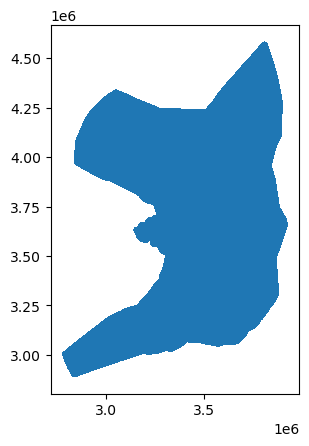

In [4]:
britain_grid_gdf.plot()

#### London Boundary
The administrative or geographical limits of Greater London, which is the area governed by the Greater London Authority (GLA)

In [5]:
london_bound = gpd.read_file (r"C:\Users\user\OneDrive - hull.ac.uk\Desktop\python\Project\Urban Analysis London\Research Data\london_bound\london_bound.shp")
london_bound

,FID,geometry
0,0,"POLYGON ((528547.085 159667.181, 528546.647 15..."


In [6]:
london_bound.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   FID       1 non-null      int64   
 1   geometry  1 non-null      geometry
dtypes: geometry(1), int64(1)
memory usage: 148.0 bytes


In [7]:
if britain_grid_gdf.crs != london_bound.crs:
    britain_grid_gdf = britain_grid_gdf.to_crs(london_bound.crs)

In [8]:
london_grid = britain_grid_gdf.sjoin(london_bound, how='left', predicate="intersects")
london_grid

,CELLCODE,EOFORIGIN,NOFORIGIN,geometry,index_right,FID
0,1kmE2780N3001,2780000,3001000,"POLYGON ((-270512.228 -157534.335, -270673.993...",NaN,NaN
1,1kmE2780N3002,2780000,3002000,"POLYGON ((-270673.993 -156549.721, -270835.771...",NaN,NaN
2,1kmE2780N3003,2780000,3003000,"POLYGON ((-270835.771 -155565.107, -270997.561...",NaN,NaN
3,1kmE2780N3004,2780000,3004000,"POLYGON ((-270997.561 -154580.494, -271159.364...",NaN,NaN
4,1kmE2780N3005,2780000,3005000,"POLYGON ((-271159.364 -153595.881, -271321.179...",NaN,NaN
...,...,...,...,...,...,...
1091779,1kmE3922N3657,3922000,3657000,"POLYGON ((751720.332 677040.744, 751548.588 67...",NaN,NaN
1091780,1kmE3922N3658,3922000,3658000,"POLYGON ((751548.588 678027.138, 751376.829 67...",NaN,NaN
1091781,1kmE3922N3659,3922000,3659000,"POLYGON ((751376.829 679013.532, 751205.053 67...",NaN,NaN
1091782,1kmE3922N3660,3922000,3660000,"POLYGON ((751205.053 679999.924, 751033.262 68...",NaN,NaN


In [9]:
london_grid.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 1091784 entries, 0 to 1091783
Data columns (total 6 columns):
 #   Column       Non-Null Count    Dtype   
---  ------       --------------    -----   
 0   CELLCODE     1091784 non-null  object  
 1   EOFORIGIN    1091784 non-null  int64   
 2   NOFORIGIN    1091784 non-null  int64   
 3   geometry     1091784 non-null  geometry
 4   index_right  1736 non-null     float64 
 5   FID          1736 non-null     float64 
dtypes: float64(2), geometry(1), int64(2), object(1)
memory usage: 58.3+ MB


In [10]:
london_grid.FID.unique()

array([nan,  0.])

In [11]:
london_grid = london_grid[london_grid['index_right'].notnull()]
london_grid.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 1736 entries, 703079 to 782206
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   CELLCODE     1736 non-null   object  
 1   EOFORIGIN    1736 non-null   int64   
 2   NOFORIGIN    1736 non-null   int64   
 3   geometry     1736 non-null   geometry
 4   index_right  1736 non-null   float64 
 5   FID          1736 non-null   float64 
dtypes: float64(2), geometry(1), int64(2), object(1)
memory usage: 94.9+ KB


In [12]:
# Save the filtered result to a new file
london_grid.to_file('london_grid_shapefile.shp')

C:\Users\user\AppData\Local\Temp\ipykernel_20256\3239867610.py:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  london_grid.to_file('london_grid_shapefile.shp')


<Axes: >

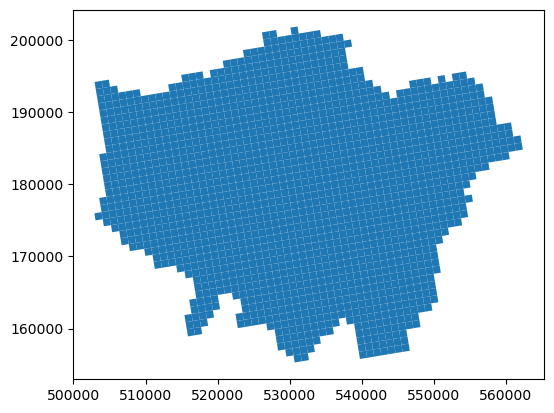

In [13]:
london_grid.plot()

In [14]:
london_grid['CELLCODE'].value_counts()

CELLCODE
1kmE3593N3203    1
1kmE3628N3192    1
1kmE3628N3203    1
1kmE3628N3202    1
1kmE3628N3201    1
                ..
1kmE3614N3216    1
1kmE3614N3215    1
1kmE3614N3214    1
1kmE3614N3213    1
1kmE3652N3204    1
Name: count, Length: 1736, dtype: int64

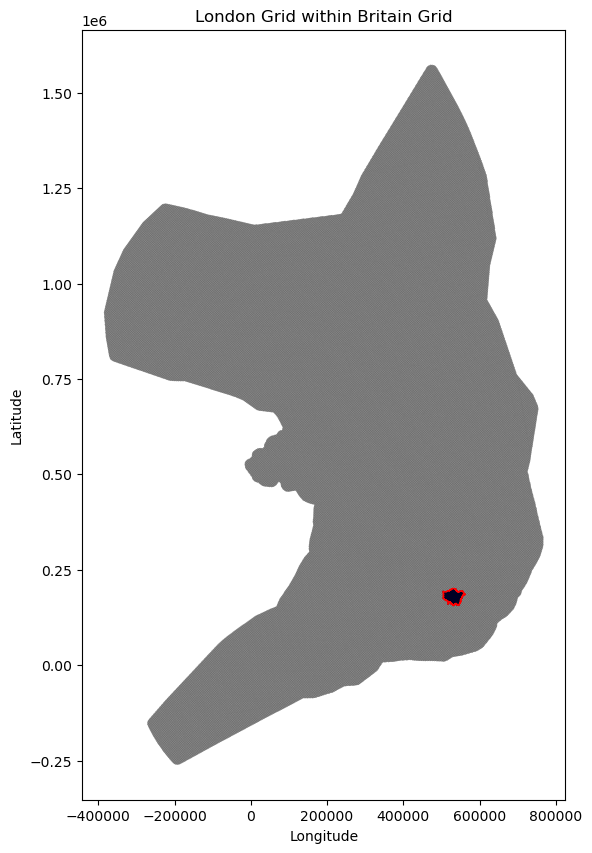

In [15]:
# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot the entire Britain grid
britain_grid_gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.1, alpha=0.5)

# Plot the London grid
london_grid.plot(ax=ax, color='blue', edgecolor='black', linewidth=0.3, alpha=0.7)

# Plot the London boundary for reference
london_bound.boundary.plot(ax=ax, color='red', linewidth=1)

# Set plot title and labels
ax.set_title('London Grid within Britain Grid')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()

#### London Land use
London land use data provides detailed information on how different areas within Greater London are utilized. This data is crucial for urban planning, development, environmental management, and policy-making. It categorizes the land into various uses such as residential, commercial, industrial, recreational, and more

In [16]:
gdf_land = gpd.read_file(r"C:\Users\user\OneDrive - hull.ac.uk/Desktop/Python/Induction/Project/Urban Analysis London/Research Data/londonlanduse/londonlanduse/london_base_landuse_geomini.shp")

# Print the first few rows to verify it loaded correctly
gdf_land.head()

,high_level,landuse_de,geometry
0,Water,Coastal water,"POLYGON ((553140.000 175520.000, 553140.000 17..."
1,Man Made,Industrial areas,"POLYGON ((551530.000 177040.000, 551530.000 17..."
2,Managed,Recreational land,"POLYGON ((552300.000 177010.000, 552300.000 17..."
3,Man Made,High density residential with retail and comme...,"POLYGON ((551710.000 177060.000, 551710.000 17..."
4,Natural,Deciduous woodland,"POLYGON ((551370.000 177140.000, 551370.000 17..."


In [17]:
gdf_land.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 41483 entries, 0 to 41482
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   high_level  41483 non-null  object  
 1   landuse_de  41483 non-null  object  
 2   geometry    41483 non-null  geometry
dtypes: geometry(1), object(2)
memory usage: 972.4+ KB


In [18]:
gdf_land['landuse_de'].unique()

array(['Coastal water', 'Industrial areas', 'Recreational land',
       'High density residential with retail and commercial sites',
       'Deciduous woodland',
       'Low density residential with amenities (suburbs and small villages / hamlets)',
       'Medium density residential with high streets and amenities',
       'Large complex buildings various use (travel/recreation/ retail)',
       'Urban centres - mainly commercial/retail with residential pockets',
       'Retail parks', 'Mining and spoil areas', 'Coastal dunes', 'Farms',
       'Inland Water', 'Agriculture - mainly crops',
       'Principle Transport', 'Open or heath and moor land',
       'Agriculture - mixed use', 'Wetlands',
       'Coniferous and undifferentiated woodland', 'Orchards',
       'Glasshouses', 'Business parks'], dtype=object)

In [19]:
gdf_land['high_level'].unique()

array(['Water', 'Man Made', 'Managed', 'Natural', 'Agricultural'],
      dtype=object)

<Axes: >

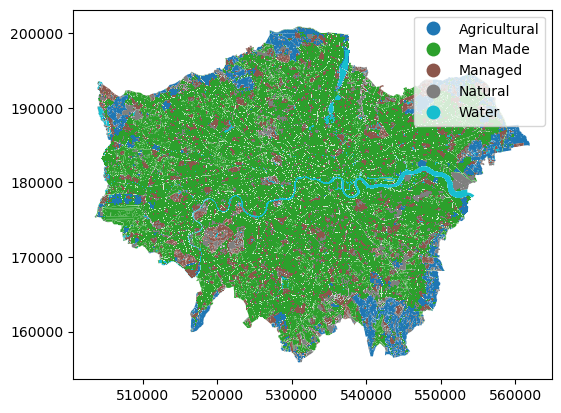

In [20]:
gdf_land.plot(column = 'high_level', legend = True)

In [21]:
# Reproject if necessary (to match the CRS of landuse_gdf with gdf_land)
if london_grid.crs != gdf_land.crs:
    gdf_land = gdf_land.to_crs(london_grid.crs)

In [22]:
# Perform a spatial join
landuse_gdf = london_grid.overlay(gdf_land, how='intersection')
landuse_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 60776 entries, 0 to 60775
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   CELLCODE     60776 non-null  object  
 1   EOFORIGIN    60776 non-null  int64   
 2   NOFORIGIN    60776 non-null  int64   
 3   index_right  60776 non-null  float64 
 4   FID          60776 non-null  float64 
 5   high_level   60776 non-null  object  
 6   landuse_de   60776 non-null  object  
 7   geometry     60776 non-null  geometry
dtypes: float64(2), geometry(1), int64(2), object(3)
memory usage: 3.7+ MB


In [23]:
landuse_gdf.head()

,CELLCODE,EOFORIGIN,NOFORIGIN,index_right,FID,high_level,landuse_de,geometry
0,1kmE3593N3203,3593000,3203000,0.0,0.0,Man Made,Principle Transport,"POLYGON ((503908.364 176067.469, 503930.000 17..."
1,1kmE3594N3202,3594000,3202000,0.0,0.0,Man Made,Principle Transport,"MULTIPOLYGON (((504431.853 175225.059, 504470...."
2,1kmE3594N3203,3594000,3203000,0.0,0.0,Man Made,Principle Transport,"MULTIPOLYGON (((503964.339 175730.000, 503957...."
3,1kmE3594N3204,3594000,3204000,0.0,0.0,Man Made,Principle Transport,"POLYGON ((504211.181 177212.002, 504280.000 17..."
4,1kmE3594N3205,3594000,3205000,0.0,0.0,Man Made,Principle Transport,"POLYGON ((504589.575 178080.000, 504606.165 17..."


<Axes: >

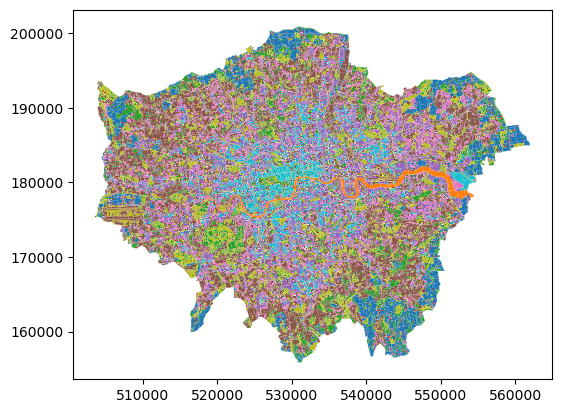

In [24]:
landuse_gdf.plot(column = 'landuse_de')

In [25]:
landuse_gdf['area'] = landuse_gdf['geometry'].area.round(2)
landuse_gdf.head()

,CELLCODE,EOFORIGIN,NOFORIGIN,index_right,FID,high_level,landuse_de,geometry,area
0,1kmE3593N3203,3593000,3203000,0.0,0.0,Man Made,Principle Transport,"POLYGON ((503908.364 176067.469, 503930.000 17...",88360.28
1,1kmE3594N3202,3594000,3202000,0.0,0.0,Man Made,Principle Transport,"MULTIPOLYGON (((504431.853 175225.059, 504470....",60049.46
2,1kmE3594N3203,3594000,3203000,0.0,0.0,Man Made,Principle Transport,"MULTIPOLYGON (((503964.339 175730.000, 503957....",116081.01
3,1kmE3594N3204,3594000,3204000,0.0,0.0,Man Made,Principle Transport,"POLYGON ((504211.181 177212.002, 504280.000 17...",121984.41
4,1kmE3594N3205,3594000,3205000,0.0,0.0,Man Made,Principle Transport,"POLYGON ((504589.575 178080.000, 504606.165 17...",53264.85


In [26]:
landuse_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 60776 entries, 0 to 60775
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype   
---  ------       --------------  -----   
 0   CELLCODE     60776 non-null  object  
 1   EOFORIGIN    60776 non-null  int64   
 2   NOFORIGIN    60776 non-null  int64   
 3   index_right  60776 non-null  float64 
 4   FID          60776 non-null  float64 
 5   high_level   60776 non-null  object  
 6   landuse_de   60776 non-null  object  
 7   geometry     60776 non-null  geometry
 8   area         60776 non-null  float64 
dtypes: float64(3), geometry(1), int64(2), object(3)
memory usage: 4.2+ MB


In [27]:
landuse_gdf = landuse_gdf.sort_values(by='CELLCODE', ascending=False)
landuse_gdf.head()

,CELLCODE,EOFORIGIN,NOFORIGIN,index_right,FID,high_level,landuse_de,geometry,area
60775,1kmE3652N3204,3652000,3204000,0.0,0.0,Water,Inland Water,"POLYGON ((561300.000 186350.000, 561230.000 18...",521.93
60760,1kmE3652N3204,3652000,3204000,0.0,0.0,Water,Inland Water,"POLYGON ((561070.000 186375.504, 561067.595 18...",17.43
60774,1kmE3652N3204,3652000,3204000,0.0,0.0,Water,Inland Water,"POLYGON ((561500.000 185930.000, 561500.000 18...",357.69
60297,1kmE3652N3204,3652000,3204000,0.0,0.0,Agricultural,Agriculture - mainly crops,"POLYGON ((561191.697 185642.043, 561077.550 18...",236293.63
60758,1kmE3652N3204,3652000,3204000,0.0,0.0,Natural,Deciduous woodland,"POLYGON ((561077.550 186330.000, 561075.891 18...",32.79


In [28]:
# First, drop the geometry column
landuse_london_grid_no_geom = landuse_gdf.drop(columns=['geometry'])

In [29]:
# Group by CELLCODE and high_level and sum the areas
landuse_london_agg= landuse_london_grid_no_geom.groupby(['CELLCODE', 'high_level']).agg({'area': 'sum'}).reset_index()

landuse_london_agg.head()

,CELLCODE,high_level,area
0,1kmE3593N3203,Agricultural,23016.37
1,1kmE3593N3203,Man Made,88360.28
2,1kmE3593N3203,Natural,46631.75
3,1kmE3594N3202,Agricultural,2932.19
4,1kmE3594N3202,Man Made,196285.20


In [30]:
landuse_london_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6406 entries, 0 to 6405
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   CELLCODE    6406 non-null   object 
 1   high_level  6406 non-null   object 
 2   area        6406 non-null   float64
dtypes: float64(1), object(2)
memory usage: 150.3+ KB


In [31]:
# Sort the grouped data by CELLCODE and area in descending order
landuse_london_grouped = landuse_london_agg.sort_values(by=['CELLCODE', 'area'], ascending=[True, False]).reset_index()

landuse_london_grouped.head()

,index,CELLCODE,high_level,area
0,1,1kmE3593N3203,Man Made,88360.28
1,2,1kmE3593N3203,Natural,46631.75
2,0,1kmE3593N3203,Agricultural,23016.37
3,4,1kmE3594N3202,Man Made,196285.20
4,5,1kmE3594N3202,Natural,35566.34


In [32]:
landuse_london_grouped.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6406 entries, 0 to 6405
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   index       6406 non-null   int64  
 1   CELLCODE    6406 non-null   object 
 2   high_level  6406 non-null   object 
 3   area        6406 non-null   float64
dtypes: float64(1), int64(1), object(2)
memory usage: 200.3+ KB


In [33]:
# Group by CELLCODE and get the index of the row with the maximum area for each group
idx = landuse_london_grouped.groupby('CELLCODE')['area'].idxmax()

# Use the indices to filter the original DataFrame
dominant_landuse = landuse_london_grouped.loc[idx].reset_index(drop=True)

# Display the result
dominant_landuse.head()

,index,CELLCODE,high_level,area
0,1,1kmE3593N3203,Man Made,88360.28
1,4,1kmE3594N3202,Man Made,196285.20
2,8,1kmE3594N3203,Man Made,381209.49
3,14,1kmE3594N3204,Natural,283930.17
4,18,1kmE3594N3205,Managed,106210.22


In [34]:
dominant_landuse.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1736 entries, 0 to 1735
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   index       1736 non-null   int64  
 1   CELLCODE    1736 non-null   object 
 2   high_level  1736 non-null   object 
 3   area        1736 non-null   float64
dtypes: float64(1), int64(1), object(2)
memory usage: 54.4+ KB


In [35]:
# Drop the unnecessary 'index' column from dominant_landuse
dominant_landuse = dominant_landuse.drop(columns=['index'])

# Merge the dominant_landuse DataFrame back into the landuse_gdf GeoDataFrame
# Ensure that the geometry from landuse_gdf is retained
london_landuse_gdf = landuse_gdf.merge(dominant_landuse, on='CELLCODE', suffixes=('', '_dominant'))

# Display the merged DataFrame information
print(london_landuse_gdf.info())

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 60776 entries, 0 to 60775
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   CELLCODE             60776 non-null  object  
 1   EOFORIGIN            60776 non-null  int64   
 2   NOFORIGIN            60776 non-null  int64   
 3   index_right          60776 non-null  float64 
 4   FID                  60776 non-null  float64 
 5   high_level           60776 non-null  object  
 6   landuse_de           60776 non-null  object  
 7   geometry             60776 non-null  geometry
 8   area                 60776 non-null  float64 
 9   high_level_dominant  60776 non-null  object  
 10  area_dominant        60776 non-null  float64 
dtypes: float64(4), geometry(1), int64(2), object(4)
memory usage: 5.1+ MB
None


In [36]:
london_landuse_gdf.head()

,CELLCODE,EOFORIGIN,NOFORIGIN,index_right,FID,high_level,landuse_de,geometry,area,high_level_dominant,area_dominant
0,1kmE3652N3204,3652000,3204000,0.0,0.0,Water,Inland Water,"POLYGON ((561300.000 186350.000, 561230.000 18...",521.93,Agricultural,236293.63
1,1kmE3652N3204,3652000,3204000,0.0,0.0,Water,Inland Water,"POLYGON ((561070.000 186375.504, 561067.595 18...",17.43,Agricultural,236293.63
2,1kmE3652N3204,3652000,3204000,0.0,0.0,Water,Inland Water,"POLYGON ((561500.000 185930.000, 561500.000 18...",357.69,Agricultural,236293.63
3,1kmE3652N3204,3652000,3204000,0.0,0.0,Agricultural,Agriculture - mainly crops,"POLYGON ((561191.697 185642.043, 561077.550 18...",236293.63,Agricultural,236293.63
4,1kmE3652N3204,3652000,3204000,0.0,0.0,Natural,Deciduous woodland,"POLYGON ((561077.550 186330.000, 561075.891 18...",32.79,Agricultural,236293.63


In [37]:
# Drop the specified columns
london_landuse_gdf = london_landuse_gdf.drop(columns=['index_right', 'FID', 'high_level', 'area'])

# Rename the dominant columns to remove the suffix
london_landuse_gdf = london_landuse_gdf.rename(columns={'high_level_dominant': 'high_level', 'area_dominant': 'area'})

# Verify the result
print(london_landuse_gdf.info())

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 60776 entries, 0 to 60775
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   CELLCODE    60776 non-null  object  
 1   EOFORIGIN   60776 non-null  int64   
 2   NOFORIGIN   60776 non-null  int64   
 3   landuse_de  60776 non-null  object  
 4   geometry    60776 non-null  geometry
 5   high_level  60776 non-null  object  
 6   area        60776 non-null  float64 
dtypes: float64(1), geometry(1), int64(2), object(3)
memory usage: 3.2+ MB
None


In [38]:
# Verify the result
london_landuse_gdf.head()

,CELLCODE,EOFORIGIN,NOFORIGIN,landuse_de,geometry,high_level,area
0,1kmE3652N3204,3652000,3204000,Inland Water,"POLYGON ((561300.000 186350.000, 561230.000 18...",Agricultural,236293.63
1,1kmE3652N3204,3652000,3204000,Inland Water,"POLYGON ((561070.000 186375.504, 561067.595 18...",Agricultural,236293.63
2,1kmE3652N3204,3652000,3204000,Inland Water,"POLYGON ((561500.000 185930.000, 561500.000 18...",Agricultural,236293.63
3,1kmE3652N3204,3652000,3204000,Agriculture - mainly crops,"POLYGON ((561191.697 185642.043, 561077.550 18...",Agricultural,236293.63
4,1kmE3652N3204,3652000,3204000,Deciduous woodland,"POLYGON ((561077.550 186330.000, 561075.891 18...",Agricultural,236293.63


In [39]:
def combine_geometries(group):
    """Combine geometries into a single geometry."""
    return group.unary_union

# Group by CELLCODE and landuse_de, then combine geometries
landuse_combined_gdf = london_landuse_gdf.groupby(['CELLCODE', 'landuse_de']).apply(lambda x: combine_geometries(x)).reset_index()

# Rename the combined geometries column
landuse_combined_gdf.columns = ['CELLCODE', 'landuse_de', 'geometry']
landuse_combined_gdf = gpd.GeoDataFrame(landuse_combined_gdf, geometry='geometry')
landuse_combined_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 14228 entries, 0 to 14227
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   CELLCODE    14228 non-null  object  
 1   landuse_de  14228 non-null  object  
 2   geometry    14228 non-null  geometry
dtypes: geometry(1), object(2)
memory usage: 333.6+ KB


In [40]:
# Assigning a CRS manually (assuming EPSG:27700)
landuse_combined_gdf.crs = "EPSG:27700"

In [41]:
landuse_combined_gdf.head()

,CELLCODE,landuse_de,geometry
0,1kmE3593N3203,Agriculture - mainly crops,"MULTIPOLYGON (((503730.000 175280.000, 503760...."
1,1kmE3593N3203,Deciduous woodland,"MULTIPOLYGON (((503780.000 175270.000, 503787...."
2,1kmE3593N3203,Open or heath and moor land,"MULTIPOLYGON (((503870.000 175440.000, 503870...."
3,1kmE3593N3203,Principle Transport,"POLYGON ((503908.364 176067.469, 503930.000 17..."
4,1kmE3594N3202,Agriculture - mainly crops,"MULTIPOLYGON (((504930.000 174810.000, 504930...."


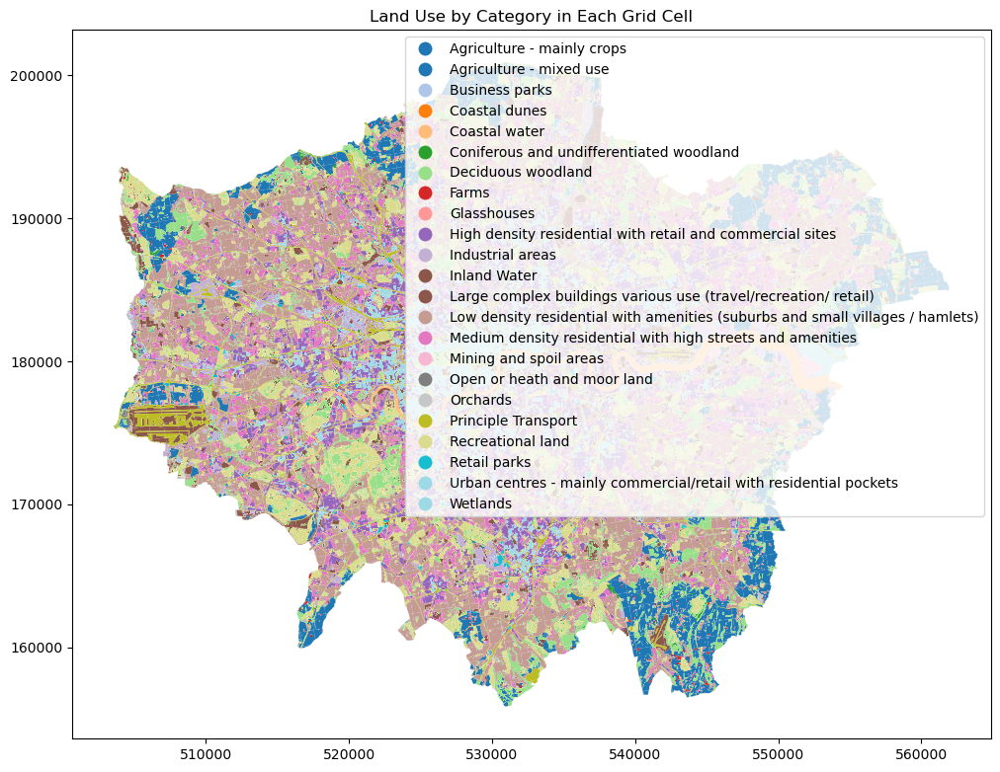

In [42]:
# Create subplots with fig and ax
fig4, ax4 = plt.subplots(figsize=(12, 10))

# Plot the combined geometries
landuse_combined_gdf.plot(column='landuse_de', ax=ax4, legend=True, cmap='tab20')

# Set the title
ax4.set_title('Land Use by Category in Each Grid Cell')

# Show the plot
plt.show()

#### Point of Interest
specific locations or landmarks within a geographical area that are significant for various purposes, such as commercial, cultural, or public services. In the context of urban environments like London, POI data is used extensively for navigation, urban planning, marketing, and data analysis.

In [43]:
# Load the GeoPackage file
poi_gdf  = gpd.read_file (r"C:\Users\user\OneDrive - hull.ac.uk/Desktop/Python/Induction/Project/Urban Analysis London/Research Data/poi_5558590/poi_5558590.gpkg")

# Display the first few rows to verify it loaded correctly
poi_gdf.head()

,ref_no,name,pointx_class,groupname,categoryname,classname,feature_easting,feature_northing,pos_accuracy,uprn,...,postcode,admin_boundary,telephone_number,url,brand,qualifier_type,qualifier_data,provenance,supply_date,geometry
0,17967878,Fountain,03170245,Attractions,Historical and Cultural,Historic and Ceremonial Structures,523926.0,165927.0,2,NaN,...,SM3,Sutton London Boro,NaN,NaN,NaN,NaN,NaN,Ordnance Survey,2024-06-01,POINT (523926.000 165927.000)
1,17969865,Clock Tower,03170245,Attractions,Historical and Cultural,Historic and Ceremonial Structures,529022.0,179133.0,2,NaN,...,SW1E,City of Westminster London Boro,NaN,NaN,NaN,NaN,NaN,Ordnance Survey,2024-06-01,POINT (529022.000 179133.000)
2,17970650,Fountain,03170245,Attractions,Historical and Cultural,Historic and Ceremonial Structures,529233.0,179665.0,2,NaN,...,SW1A,City of Westminster London Boro,NaN,NaN,NaN,NaN,NaN,Ordnance Survey,2024-06-01,POINT (529233.000 179665.000)
3,17970666,Flagstaff,03170245,Attractions,Historical and Cultural,Historic and Ceremonial Structures,529659.0,178834.0,2,NaN,...,SW1P,City of Westminster London Boro,NaN,NaN,NaN,NaN,NaN,Ordnance Survey,2024-06-01,POINT (529659.000 178834.000)
4,17972867,Fountain,03170245,Attractions,Historical and Cultural,Historic and Ceremonial Structures,529966.0,180448.0,2,NaN,...,WC2N,City of Westminster London Boro,NaN,NaN,NaN,NaN,NaN,Ordnance Survey,2024-06-01,POINT (529966.000 180448.000)


In [44]:
poi_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 385401 entries, 0 to 385400
Data columns (total 29 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   ref_no             385401 non-null  int64   
 1   name               385401 non-null  object  
 2   pointx_class       385401 non-null  object  
 3   groupname          385401 non-null  object  
 4   categoryname       385401 non-null  object  
 5   classname          385401 non-null  object  
 6   feature_easting    385401 non-null  float64 
 7   feature_northing   385401 non-null  float64 
 8   pos_accuracy       385401 non-null  int64   
 9   uprn               273226 non-null  float64 
 10  topo_toid          385401 non-null  object  
 11  topo_toid_version  385401 non-null  int64   
 12  usrn               385401 non-null  object  
 13  usrn_mi            385401 non-null  int64   
 14  distance           385401 non-null  float64 
 15  address_detail     281731 

##### Identify Reference Points for Cleaning: 
Dropping Unnecessary Columns: Removes columns not needed for processing.

Separating Rows with Null Values: Identifies rows with missing 'address_detail', 'street_name', or 'locality' values.

Use the Nominatim geocoder from Geopy to retrieve address details based on the provided latitude, longitude, and postcode. It handles timeouts and retries to ensure reliable geocoding.

Use the apply function to iterate over rows in the GeoDataFrame and apply the geocoding function to fill in missing address details

In [45]:
def drop_unnecessary_columns(poi_gdf):
    """
    Drop unnecessary columns from the POI GeoDataFrame.
    """
    columns_to_drop = [
        'uprn', 'telephone_number', 'url', 'brand', 'qualifier_type', 'qualifier_data', 
        'provenance', 'supply_date'
    ]
    return poi_gdf.drop(columns=columns_to_drop)

In [46]:
# Mapping for positional accuracy codes
pos_accuracy_mapping = {
    1: {'address_detail': 'address or location', 'street_name': 'address or location', 'locality': 'address or location'},
    2: {'address_detail': 'adjacent address or location', 'street_name': 'adjacent address or location', 'locality': 'adjacent address or location'},
    3: {'address_detail': 'road within address or location', 'street_name': 'road within address or location', 'locality': 'road within address or location'},
    4: {'address_detail': 'geographical locality', 'street_name': 'geographical locality', 'locality': 'geographical locality'}
}

# Function to fill missing address details based on pos_accuracy
def fill_address_details(row):
    pos_accuracy = row['pos_accuracy']
    if pd.isna(row['address_detail']) or pd.isna(row['street_name']) or pd.isna(row['locality']):
        if pos_accuracy in pos_accuracy_mapping:
            row['address_detail'] = pos_accuracy_mapping[pos_accuracy]['address_detail']
            row['street_name'] = pos_accuracy_mapping[pos_accuracy]['street_name']
            row['locality'] = pos_accuracy_mapping[pos_accuracy]['locality']
    return row

In [47]:
# Process the points of interest GeoDataFrame
poi_gdf = drop_unnecessary_columns(poi_gdf)
# Apply the function to fill missing address details
poi_gdf = poi_gdf.apply(fill_address_details, axis=1)

# Display the updated GeoDataFrame
poi_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 385401 entries, 0 to 385400
Data columns (total 21 columns):
 #   Column             Non-Null Count   Dtype   
---  ------             --------------   -----   
 0   ref_no             385401 non-null  int64   
 1   name               385401 non-null  object  
 2   pointx_class       385401 non-null  object  
 3   groupname          385401 non-null  object  
 4   categoryname       385401 non-null  object  
 5   classname          385401 non-null  object  
 6   feature_easting    385401 non-null  float64 
 7   feature_northing   385401 non-null  float64 
 8   pos_accuracy       385401 non-null  int64   
 9   topo_toid          385401 non-null  object  
 10  topo_toid_version  385401 non-null  int64   
 11  usrn               385401 non-null  object  
 12  usrn_mi            385401 non-null  int64   
 13  distance           385401 non-null  float64 
 14  address_detail     385401 non-null  object  
 15  street_name        385401 

In [48]:
poi_gdf['groupname'].unique()

array(['Attractions', 'Public Infrastructure', 'Education and Health',
       'Commercial Services', 'Manufacturing and Production',
       'Accommodation, Eating and Drinking', 'Transport',
       'Sport and Entertainment', 'Retail'], dtype=object)

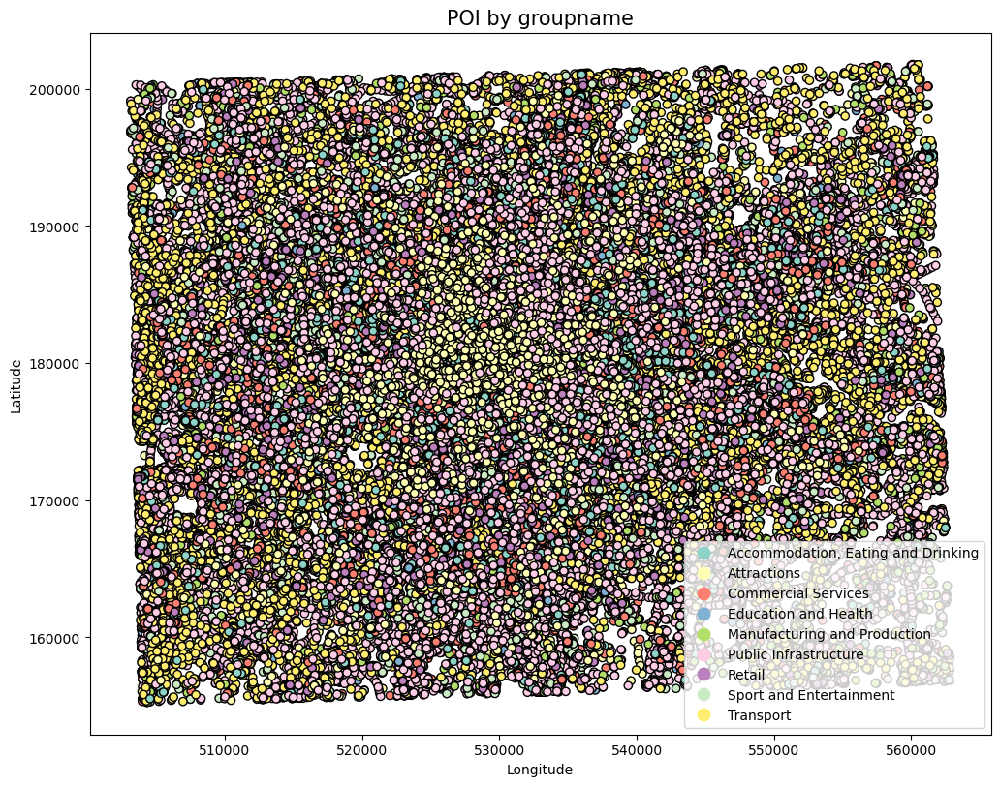

In [49]:
fig, ax = plt.subplots(figsize=(12, 10))
poi_gdf.plot(column='groupname', ax=ax, legend=True, cmap='Set3', edgecolor='k')

# Set plot title and labels
ax.set_title('POI by groupname', fontsize=15)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()

In [50]:
# Select relevant columns from POI data
poi_gdf_selected = poi_gdf[['name', 'groupname', 'categoryname', 'classname', 'pos_accuracy', 'geometry']]

# Perform the spatial join
poi_london_landuse_gdf = gpd.sjoin(landuse_combined_gdf, poi_gdf_selected, how='left', predicate='intersects')

In [51]:
poi_london_landuse_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 333864 entries, 0 to 14227
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   CELLCODE      333864 non-null  object  
 1   landuse_de    333864 non-null  object  
 2   geometry      333864 non-null  geometry
 3   index_right   330968 non-null  float64 
 4   name          330968 non-null  object  
 5   groupname     330968 non-null  object  
 6   categoryname  330968 non-null  object  
 7   classname     330968 non-null  object  
 8   pos_accuracy  330968 non-null  float64 
dtypes: float64(2), geometry(1), object(6)
memory usage: 25.5+ MB


In [52]:
# Group by CELLCODE and groupname, then count occurrences
poi_counts = poi_london_landuse_gdf.groupby(['CELLCODE', 'groupname']).size().reset_index(name='count')

# Pivot the data
poi_pivot = poi_counts.pivot(index='CELLCODE', columns='groupname', values='count').fillna(0)

# Add 'poi_' prefix to column names
poi_pivot.columns = ['poi_' + col for col in poi_pivot.columns]

# Display the pivot table
print(poi_pivot.info())

<class 'pandas.core.frame.DataFrame'>
Index: 1685 entries, 1kmE3593N3203 to 1kmE3652N3203
Data columns (total 9 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   poi_Accommodation, Eating and Drinking  1685 non-null   float64
 1   poi_Attractions                         1685 non-null   float64
 2   poi_Commercial Services                 1685 non-null   float64
 3   poi_Education and Health                1685 non-null   float64
 4   poi_Manufacturing and Production        1685 non-null   float64
 5   poi_Public Infrastructure               1685 non-null   float64
 6   poi_Retail                              1685 non-null   float64
 7   poi_Sport and Entertainment             1685 non-null   float64
 8   poi_Transport                           1685 non-null   float64
dtypes: float64(9)
memory usage: 131.6+ KB
None


In [53]:
poi_pivot.head()

,"poi_Accommodation, Eating and Drinking",poi_Attractions,poi_Commercial Services,poi_Education and Health,poi_Manufacturing and Production,poi_Public Infrastructure,poi_Retail,poi_Sport and Entertainment,poi_Transport
CELLCODE,,,,,,,,,
1kmE3593N3203,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
1kmE3594N3202,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
1kmE3594N3203,1.0,1.0,5.0,4.0,1.0,10.0,0.0,0.0,11.0
1kmE3594N3204,0.0,1.0,0.0,0.0,1.0,6.0,0.0,0.0,20.0
1kmE3594N3205,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0


In [54]:
# Ensure the pivot table index is a column
poi_pivot.reset_index(inplace=True)

# Merge the pivot table back into the original GeoDataFrame
poi_london_landuse_gdf = poi_london_landuse_gdf.merge(poi_pivot, on='CELLCODE', how='left')

# Display the merged GeoDataFrame
print(poi_london_landuse_gdf.info())

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 333864 entries, 0 to 333863
Data columns (total 18 columns):
 #   Column                                  Non-Null Count   Dtype   
---  ------                                  --------------   -----   
 0   CELLCODE                                333864 non-null  object  
 1   landuse_de                              333864 non-null  object  
 2   geometry                                333864 non-null  geometry
 3   index_right                             330968 non-null  float64 
 4   name                                    330968 non-null  object  
 5   groupname                               330968 non-null  object  
 6   categoryname                            330968 non-null  object  
 7   classname                               330968 non-null  object  
 8   pos_accuracy                            330968 non-null  float64 
 9   poi_Accommodation, Eating and Drinking  333710 non-null  float64 
 10  poi_Attractions         

In [55]:
poi_london_landuse_gdf.head()

,CELLCODE,landuse_de,geometry,index_right,name,groupname,categoryname,classname,pos_accuracy,"poi_Accommodation, Eating and Drinking",poi_Attractions,poi_Commercial Services,poi_Education and Health,poi_Manufacturing and Production,poi_Public Infrastructure,poi_Retail,poi_Sport and Entertainment,poi_Transport
0,1kmE3593N3203,Agriculture - mainly crops,"MULTIPOLYGON (((503730.000 175280.000, 503760....",NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
1,1kmE3593N3203,Deciduous woodland,"MULTIPOLYGON (((503780.000 175270.000, 503787....",NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
2,1kmE3593N3203,Open or heath and moor land,"MULTIPOLYGON (((503870.000 175440.000, 503870....",NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
3,1kmE3593N3203,Principle Transport,"POLYGON ((503908.364 176067.469, 503930.000 17...",313784.0,Bridge,Transport,Road and Rail,Bridges,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
4,1kmE3593N3203,Principle Transport,"POLYGON ((503908.364 176067.469, 503930.000 17...",313833.0,Bridge,Transport,Road and Rail,Bridges,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0


In [56]:
poi_london_landuse_gdf = poi_london_landuse_gdf.dropna()
print(poi_london_landuse_gdf.info())

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 330968 entries, 3 to 333858
Data columns (total 18 columns):
 #   Column                                  Non-Null Count   Dtype   
---  ------                                  --------------   -----   
 0   CELLCODE                                330968 non-null  object  
 1   landuse_de                              330968 non-null  object  
 2   geometry                                330968 non-null  geometry
 3   index_right                             330968 non-null  float64 
 4   name                                    330968 non-null  object  
 5   groupname                               330968 non-null  object  
 6   categoryname                            330968 non-null  object  
 7   classname                               330968 non-null  object  
 8   pos_accuracy                            330968 non-null  float64 
 9   poi_Accommodation, Eating and Drinking  330968 non-null  float64 
 10  poi_Attractions              

### Bus Stops
The detailed geospatial and operational information about bus stops located across Greater London.

In [57]:
busstops_df = pd.read_csv(r"C:\Users\user\OneDrive - hull.ac.uk\Desktop\python\Project\Urban Analysis London\Research Data\bus-stops.csv")
busstops_df.head()

,Stop_Code_LBSL,Bus_Stop_Code,Naptan_Atco,Stop_Name,Location_Easting,Location_Northing,Heading,Stop_Area,Virtual_Bus_Stop
0,13,73812,490006428B,Edgware Road Station <>,526970,181785,343.0,2,0
1,14,52232,490000144E,Marble Arch / Edgware Road,527686,181041,310.0,Y878,0
2,16,51224,490001296A,Tooting Station #,527904,170535,13.0,5.00E+12,0
3,21,59519,490007614N,Hillmarton Road,530159,185489,36.0,CH03,0
4,29,47488,490001231F,Putney Station #,524050,175022,107.0,5S09,0


In [58]:
busstops_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20398 entries, 0 to 20397
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Stop_Code_LBSL     20398 non-null  object 
 1   Bus_Stop_Code      20387 non-null  object 
 2   Naptan_Atco        20393 non-null  object 
 3   Stop_Name          20398 non-null  object 
 4   Location_Easting   20398 non-null  int64  
 5   Location_Northing  20398 non-null  int64  
 6   Heading            20374 non-null  float64
 7   Stop_Area          20398 non-null  object 
 8   Virtual_Bus_Stop   20398 non-null  int64  
dtypes: float64(1), int64(3), object(5)
memory usage: 1.4+ MB


In [59]:
# Fill 'Bus_Stop_Code' using 'Stop_Code_LBSL' or 'Stop_Name'
busstops_df['Bus_Stop_Code'] = busstops_df.apply(
    lambda row: row['Stop_Code_LBSL'] if pd.isna(row['Bus_Stop_Code']) else row['Bus_Stop_Code'], axis=1)

# Fill 'Naptan_Atco' using 'Stop_Code_LBSL' or 'Stop_Name'
busstops_df['Naptan_Atco'] = busstops_df.apply(
    lambda row: row['Stop_Code_LBSL'] if pd.isna(row['Naptan_Atco']) else row['Naptan_Atco'], axis=1)

# Fill 'Heading' using the mean of the column
mean_heading = busstops_df['Heading'].mean()
busstops_df['Heading'] = busstops_df['Heading'].fillna(mean_heading)

# Check the result
busstops_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20398 entries, 0 to 20397
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Stop_Code_LBSL     20398 non-null  object 
 1   Bus_Stop_Code      20398 non-null  object 
 2   Naptan_Atco        20398 non-null  object 
 3   Stop_Name          20398 non-null  object 
 4   Location_Easting   20398 non-null  int64  
 5   Location_Northing  20398 non-null  int64  
 6   Heading            20398 non-null  float64
 7   Stop_Area          20398 non-null  object 
 8   Virtual_Bus_Stop   20398 non-null  int64  
dtypes: float64(1), int64(3), object(5)
memory usage: 1.4+ MB


In [60]:
# Create geometry column from easting and northing
busstops_df['bus_geometry'] = busstops_df.apply(lambda row: Point(row['Location_Easting'], row['Location_Northing']), axis=1)

# Convert to GeoDataFrame
busstops_gdf = gpd.GeoDataFrame(busstops_df, geometry='bus_geometry', crs="EPSG:27700")
busstops_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 20398 entries, 0 to 20397
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   Stop_Code_LBSL     20398 non-null  object  
 1   Bus_Stop_Code      20398 non-null  object  
 2   Naptan_Atco        20398 non-null  object  
 3   Stop_Name          20398 non-null  object  
 4   Location_Easting   20398 non-null  int64   
 5   Location_Northing  20398 non-null  int64   
 6   Heading            20398 non-null  float64 
 7   Stop_Area          20398 non-null  object  
 8   Virtual_Bus_Stop   20398 non-null  int64   
 9   bus_geometry       20398 non-null  geometry
dtypes: float64(1), geometry(1), int64(3), object(5)
memory usage: 1.6+ MB


<Axes: >

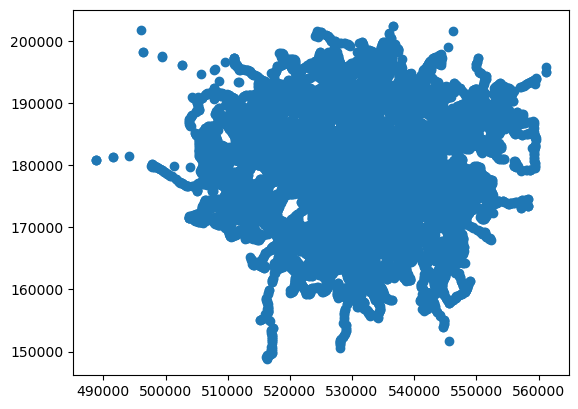

In [61]:
busstops_gdf.plot()

##### Assign bus stops to grid cells:
I will create centroids for each bus stop's geometry to ensure a point-in-polygon operation.

I  will extract unique grid cells from poi_london_landuse_gdf.

I will use gpd.sjoin to assign each bus stop to a grid cell.

##### Count bus stops in each grid cell:
I wil group the joined data by CELLCODE and count the occurrences.

##### Merge bus stop counts back to main dataset:
I will merge the bus stop counts back into poi_london_landuse_gdf.

I will fill any NaN values with 0 for grid cells that don't have any bus stops.

In [62]:
# Prepare the grid and bus stop data
busstops_gdf['centroid'] = busstops_gdf['bus_geometry'].centroid
grid_gdf = poi_london_landuse_gdf[['CELLCODE', 'geometry']].drop_duplicates('CELLCODE')

# Spatial join grid to bus stops
busstops_with_grid = gpd.sjoin(grid_gdf, busstops_gdf, how='left', predicate='contains')

busstops_with_grid.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 2477 entries, 3 to 333856
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   CELLCODE           2477 non-null   object  
 1   geometry           2477 non-null   geometry
 2   index_right        1307 non-null   float64 
 3   Stop_Code_LBSL     1307 non-null   object  
 4   Bus_Stop_Code      1307 non-null   object  
 5   Naptan_Atco        1307 non-null   object  
 6   Stop_Name          1307 non-null   object  
 7   Location_Easting   1307 non-null   float64 
 8   Location_Northing  1307 non-null   float64 
 9   Heading            1307 non-null   float64 
 10  Stop_Area          1307 non-null   object  
 11  Virtual_Bus_Stop   1307 non-null   float64 
 12  centroid           1307 non-null   geometry
dtypes: float64(5), geometry(2), object(6)
memory usage: 270.9+ KB


In [63]:
busstops_with_grid.head()

,CELLCODE,geometry,index_right,Stop_Code_LBSL,Bus_Stop_Code,Naptan_Atco,Stop_Name,Location_Easting,Location_Northing,Heading,Stop_Area,Virtual_Bus_Stop,centroid
3,1kmE3593N3203,"POLYGON ((503908.364 176067.469, 503930.000 17...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
6,1kmE3594N3202,"MULTIPOLYGON (((505030.000 174730.000, 505050....",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
14,1kmE3594N3203,"POLYGON ((504014.099 175430.000, 503992.536 17...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
49,1kmE3594N3204,"MULTIPOLYGON (((503930.000 176190.000, 503925....",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None
78,1kmE3594N3205,"MULTIPOLYGON (((504400.000 177820.000, 504410....",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None


In [64]:
#Count the number of bus stops in each grid cell
busstop_counts = busstops_with_grid.groupby('CELLCODE').size().reset_index(name='busstop_count')
busstop_counts.head()

,CELLCODE,busstop_count
0,1kmE3593N3203,1
1,1kmE3594N3202,1
2,1kmE3594N3203,1
3,1kmE3594N3204,1
4,1kmE3594N3205,1


In [65]:
# Merge the bus stop counts back into the main dataset
bus_poi_london_landuse_gdf = poi_london_landuse_gdf.merge(busstop_counts, on='CELLCODE', how='left')

# Fill NaN values with 0 for grid cells that don't have any bus stops
bus_poi_london_landuse_gdf['busstop_count'] = bus_poi_london_landuse_gdf['busstop_count'].fillna(0)

# Display the result
print(bus_poi_london_landuse_gdf.info())

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 330968 entries, 0 to 330967
Data columns (total 19 columns):
 #   Column                                  Non-Null Count   Dtype   
---  ------                                  --------------   -----   
 0   CELLCODE                                330968 non-null  object  
 1   landuse_de                              330968 non-null  object  
 2   geometry                                330968 non-null  geometry
 3   index_right                             330968 non-null  float64 
 4   name                                    330968 non-null  object  
 5   groupname                               330968 non-null  object  
 6   categoryname                            330968 non-null  object  
 7   classname                               330968 non-null  object  
 8   pos_accuracy                            330968 non-null  float64 
 9   poi_Accommodation, Eating and Drinking  330968 non-null  float64 
 10  poi_Attractions         

In [66]:
bus_poi_london_landuse_gdf.head()

,CELLCODE,landuse_de,geometry,index_right,name,groupname,categoryname,classname,pos_accuracy,"poi_Accommodation, Eating and Drinking",poi_Attractions,poi_Commercial Services,poi_Education and Health,poi_Manufacturing and Production,poi_Public Infrastructure,poi_Retail,poi_Sport and Entertainment,poi_Transport,busstop_count
0,1kmE3593N3203,Principle Transport,"POLYGON ((503908.364 176067.469, 503930.000 17...",313784.0,Bridge,Transport,Road and Rail,Bridges,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1
1,1kmE3593N3203,Principle Transport,"POLYGON ((503908.364 176067.469, 503930.000 17...",313833.0,Bridge,Transport,Road and Rail,Bridges,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1
2,1kmE3594N3202,Deciduous woodland,"MULTIPOLYGON (((505030.000 174730.000, 505050....",311788.0,Mast (Telecommunication),Public Infrastructure,Infrastructure and Facilities,Telecommunications Features,2.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1
3,1kmE3594N3202,Industrial areas,"POLYGON ((504550.000 175244.632, 504810.000 17...",250180.0,Reservoir,Attractions,Bodies Of Water,Reservoirs,1.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1
4,1kmE3594N3202,Large complex buildings various use (travel/re...,"POLYGON ((504890.000 175300.960, 505046.272 17...",311755.0,Electricity Sub Station,Public Infrastructure,Infrastructure and Facilities,Electrical Features,2.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,1


In [67]:
import requests
import xml.etree.ElementTree as ET

In [68]:
# URL of the XML file
xml_url = "https://tfl.gov.uk/tfl/syndication/feeds/cycle-hire/livecyclehireupdates.xml"

# Fetch the XML data
response = requests.get(xml_url)

# Check if the request was successful
if response.status_code == 200:
    # Parse the XML content
    root = ET.fromstring(response.content)

    # Create a list to store the data
    data = []

    # Iterate through each station in the XML
    for station in root.findall('.//station'):
        station_data = {}
        for child in station:
            station_data[child.tag] = child.text
        data.append(station_data)

    # Create a DataFrame from the list of dictionaries
    cycle_df = pd.DataFrame(data)
    print(f"\nTotal number of stations: {len(cycle_df)}")


Total number of stations: 797


In [69]:
cycle_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 797 entries, 0 to 796
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               797 non-null    object
 1   name             797 non-null    object
 2   terminalName     797 non-null    object
 3   lat              797 non-null    object
 4   long             797 non-null    object
 5   installed        797 non-null    object
 6   locked           797 non-null    object
 7   installDate      709 non-null    object
 8   removalDate      3 non-null      object
 9   temporary        797 non-null    object
 10  nbBikes          797 non-null    object
 11  nbStandardBikes  797 non-null    object
 12  nbEBikes         797 non-null    object
 13  nbEmptyDocks     797 non-null    object
 14  nbDocks          797 non-null    object
dtypes: object(15)
memory usage: 93.5+ KB


In [70]:
cycle_df.head()

,id,name,terminalName,lat,long,installed,locked,installDate,removalDate,temporary,nbBikes,nbStandardBikes,nbEBikes,nbEmptyDocks,nbDocks
0,1,"River Street , Clerkenwell",001023,51.52916347,-0.109970527,true,false,1278947280000,None,false,2,2,0,17,19
1,2,"Phillimore Gardens, Kensington",001018,51.49960695,-0.197574246,true,false,1278585780000,None,false,15,13,2,19,37
2,3,"Christopher Street, Liverpool Street",001012,51.52128377,-0.084605692,true,false,1278240360000,None,false,1,1,0,31,32
3,4,"St. Chad's Street, King's Cross",001013,51.53005939,-0.120973687,true,false,1278241080000,None,false,23,23,0,0,23
4,5,"Sedding Street, Sloane Square",003420,51.49313,-0.156876,true,false,1278241440000,None,false,7,7,0,18,27


In [71]:
# Convert cycle_df to a GeoDataFrame
cycle_df['lat'] = cycle_df['lat'].astype(float)
cycle_df['long'] = cycle_df['long'].astype(float)
cycle_df['geometry'] = cycle_df.apply(lambda row: Point(row['long'], row['lat']), axis=1)
cycle_gdf = gpd.GeoDataFrame(cycle_df, geometry='geometry')
cycle_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 797 entries, 0 to 796
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   id               797 non-null    object  
 1   name             797 non-null    object  
 2   terminalName     797 non-null    object  
 3   lat              797 non-null    float64 
 4   long             797 non-null    float64 
 5   installed        797 non-null    object  
 6   locked           797 non-null    object  
 7   installDate      709 non-null    object  
 8   removalDate      3 non-null      object  
 9   temporary        797 non-null    object  
 10  nbBikes          797 non-null    object  
 11  nbStandardBikes  797 non-null    object  
 12  nbEBikes         797 non-null    object  
 13  nbEmptyDocks     797 non-null    object  
 14  nbDocks          797 non-null    object  
 15  geometry         797 non-null    geometry
dtypes: float64(2), geometry(1), object(1

In [72]:
# Ensure CRS is the same
# Set the CRS of cycle_gdf to WGS84 (EPSG:4326) if it's not already set
cycle_gdf = cycle_gdf.set_crs("EPSG:4326", allow_override=True)

# Reproject cycle_gdf to match the CRS of poi_landuse_with_busstops
cycle_gdf = cycle_gdf.to_crs(bus_poi_london_landuse_gdf.crs)

<Axes: >

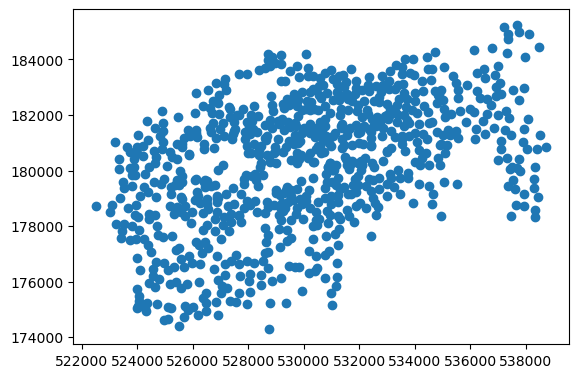

In [73]:
cycle_gdf.plot()

In [74]:
cycle_gdf.head()

,id,name,terminalName,lat,long,installed,locked,installDate,removalDate,temporary,nbBikes,nbStandardBikes,nbEBikes,nbEmptyDocks,nbDocks,geometry
0,1,"River Street , Clerkenwell",001023,51.529163,-0.109971,true,false,1278947280000,None,false,2,2,0,17,19,POINT (531203.517 182832.066)
1,2,"Phillimore Gardens, Kensington",001018,51.499607,-0.197574,true,false,1278585780000,None,false,15,13,2,19,37,POINT (525208.067 179391.922)
2,3,"Christopher Street, Liverpool Street",001012,51.521284,-0.084606,true,false,1278240360000,None,false,1,1,0,31,32,POINT (532985.807 182001.572)
3,4,"St. Chad's Street, King's Cross",001013,51.530059,-0.120974,true,false,1278241080000,None,false,23,23,0,0,23,POINT (530437.757 182912.038)
4,5,"Sedding Street, Sloane Square",003420,51.493130,-0.156876,true,false,1278241440000,None,false,7,7,0,18,27,POINT (528050.966 178742.004)


###### Convert to numeric:
I will convert nbBikes, nbEBikes, and nbDocks to numeric types, using pd.to_numeric() with errors='coerce' to handle any non-numeric values.
###### Prepare the grid: 
I will extract unique grid cells from the existing dataset.
###### Spatial join: 
I will join the grid to the cycle share points.
###### Aggregate data: I will group by CELLCODE and aggregate the data
Count of terminalName for cycleshare_terminal

Sum of nbBikes for cycle_count

Sum of nbEBikes for ebike_count

Sum of nbDocks for dock_share
###### Merge and clean:
I will merge the aggregated data back into the main dataset and fill NaN values with 0.

In [75]:
# Convert relevant columns to numeric
columns_to_convert = ['nbStandardBikes', 'nbEBikes', 'nbDocks']
for col in columns_to_convert:
    cycle_gdf[col] = pd.to_numeric(cycle_gdf[col], errors='coerce')

# repare the grid
grid_gdf = bus_poi_london_landuse_gdf[['CELLCODE', 'geometry']].drop_duplicates('CELLCODE')

In [76]:
# Spatial join grid to cycle share points
cycle_with_grid = gpd.sjoin(grid_gdf, cycle_gdf, how='left', predicate='intersects')
cycle_with_grid.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 1690 entries, 0 to 330965
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype   
---  ------           --------------  -----   
 0   CELLCODE         1690 non-null   object  
 1   geometry         1690 non-null   geometry
 2   index_right      29 non-null     float64 
 3   id               29 non-null     object  
 4   name             29 non-null     object  
 5   terminalName     29 non-null     object  
 6   lat              29 non-null     float64 
 7   long             29 non-null     float64 
 8   installed        29 non-null     object  
 9   locked           29 non-null     object  
 10  installDate      28 non-null     object  
 11  removalDate      0 non-null      object  
 12  temporary        29 non-null     object  
 13  nbBikes          29 non-null     object  
 14  nbStandardBikes  29 non-null     float64 
 15  nbEBikes         29 non-null     float64 
 16  nbEmptyDocks     29 non-null     obje

In [77]:
# Aggregate cycle share data by CELLCODE
cycle_aggregated = cycle_with_grid.groupby('CELLCODE').agg({
    'terminalName': 'count',
    'nbStandardBikes': 'sum',
    'nbEBikes': 'sum',
    'nbDocks': 'sum'
}).reset_index()

# Rename columns and calculate total bikes
cycle_aggregated.columns = ['CELLCODE', 'cycleshare_terminal', 'standard_bike_count', 'ebike_count', 'dock_share']
cycle_aggregated['total_bike_count'] = cycle_aggregated['standard_bike_count'] + cycle_aggregated['ebike_count']

#  Merge the aggregated cycle share data back into the main dataset
urban_function_df = bus_poi_london_landuse_gdf.merge(cycle_aggregated, on='CELLCODE', how='left')

In [78]:
# Fill NaN values with 0 for grid cells that don't have any cycle share data
columns_to_fill = ['cycleshare_terminal', 'standard_bike_count', 'ebike_count', 'total_bike_count', 'dock_share']
urban_function_df[columns_to_fill] = urban_function_df[columns_to_fill].fillna(0)

# Convert columns to integer type
urban_function_df[columns_to_fill] = urban_function_df[columns_to_fill].astype(int)

# Display the result
print(urban_function_df.info())

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 330968 entries, 0 to 330967
Data columns (total 24 columns):
 #   Column                                  Non-Null Count   Dtype   
---  ------                                  --------------   -----   
 0   CELLCODE                                330968 non-null  object  
 1   landuse_de                              330968 non-null  object  
 2   geometry                                330968 non-null  geometry
 3   index_right                             330968 non-null  float64 
 4   name                                    330968 non-null  object  
 5   groupname                               330968 non-null  object  
 6   categoryname                            330968 non-null  object  
 7   classname                               330968 non-null  object  
 8   pos_accuracy                            330968 non-null  float64 
 9   poi_Accommodation, Eating and Drinking  330968 non-null  float64 
 10  poi_Attractions         

In [79]:
#Mapping landuse to a category
landuse_mapping = {
    'Low density residential with amenities (suburbs and small villages / hamlets)': 'Residential',
    'High density residential with retail and commercial sites': 'Residential',  # Prioritizing Residential
    'Medium density residential with high streets and amenities': 'Residential',
    'Urban centres - mainly commercial/retail with residential pockets': 'Commercial', # Prioritizing 'Commercial'
    'Retail parks': 'Commercial',
    'Industrial areas': 'Industrial',
    'Business parks': 'Commercial',
    'Large complex buildings various use (travel/recreation/ retail)': 'Commercial',
    'Recreational land': 'Recreational',
    'Deciduous woodland': 'Natural',
    'Coniferous and undifferentiated woodland': 'Natural',
    'Inland Water': 'Water',
    'Coastal water': 'Water',
    'Agriculture - mainly crops': 'Agricultural',
    'Farms': 'Agricultural',
    'Agriculture - mixed use': 'Agricultural',
    'Mining and spoil areas': 'Industrial',
    'Wetlands': 'Water',
    'Open or heath and moor land': 'Natural',
    'Glasshouses': 'Agricultural',
    'Orchards': 'Agricultural',
    'Coastal dunes': 'Natural',
    'Principle Transport': 'Transport'
}

In [80]:
# Apply mapping
urban_function_df['Landuse_Category'] = urban_function_df['landuse_de'].map(landuse_mapping)

# Check the result
urban_function_df.head()

,CELLCODE,landuse_de,geometry,index_right,name,groupname,categoryname,classname,pos_accuracy,"poi_Accommodation, Eating and Drinking",...,poi_Retail,poi_Sport and Entertainment,poi_Transport,busstop_count,cycleshare_terminal,standard_bike_count,ebike_count,dock_share,total_bike_count,Landuse_Category
0,1kmE3593N3203,Principle Transport,"POLYGON ((503908.364 176067.469, 503930.000 17...",313784.0,Bridge,Transport,Road and Rail,Bridges,2.0,0.0,...,0.0,0.0,2.0,1,0,0,0,0,0,Transport
1,1kmE3593N3203,Principle Transport,"POLYGON ((503908.364 176067.469, 503930.000 17...",313833.0,Bridge,Transport,Road and Rail,Bridges,2.0,0.0,...,0.0,0.0,2.0,1,0,0,0,0,0,Transport
2,1kmE3594N3202,Deciduous woodland,"MULTIPOLYGON (((505030.000 174730.000, 505050....",311788.0,Mast (Telecommunication),Public Infrastructure,Infrastructure and Facilities,Telecommunications Features,2.0,0.0,...,0.0,0.0,0.0,1,0,0,0,0,0,Natural
3,1kmE3594N3202,Industrial areas,"POLYGON ((504550.000 175244.632, 504810.000 17...",250180.0,Reservoir,Attractions,Bodies Of Water,Reservoirs,1.0,0.0,...,0.0,0.0,0.0,1,0,0,0,0,0,Industrial
4,1kmE3594N3202,Large complex buildings various use (travel/re...,"POLYGON ((504890.000 175300.960, 505046.272 17...",311755.0,Electricity Sub Station,Public Infrastructure,Infrastructure and Facilities,Electrical Features,2.0,0.0,...,0.0,0.0,0.0,1,0,0,0,0,0,Commercial


In [81]:
urban_function_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 330968 entries, 0 to 330967
Data columns (total 25 columns):
 #   Column                                  Non-Null Count   Dtype   
---  ------                                  --------------   -----   
 0   CELLCODE                                330968 non-null  object  
 1   landuse_de                              330968 non-null  object  
 2   geometry                                330968 non-null  geometry
 3   index_right                             330968 non-null  float64 
 4   name                                    330968 non-null  object  
 5   groupname                               330968 non-null  object  
 6   categoryname                            330968 non-null  object  
 7   classname                               330968 non-null  object  
 8   pos_accuracy                            330968 non-null  float64 
 9   poi_Accommodation, Eating and Drinking  330968 non-null  float64 
 10  poi_Attractions         

In [82]:
def enhance_urban_function_df(urban_function_df):
    """
    Enhances the urban_function_df GeoDataFrame by adding calculated columns
    and removing unnecessary ones.

    Parameters:
    urban_function_df (GeoDataFrame): The input GeoDataFrame containing urban function data.

    Returns:
    GeoDataFrame: The updated GeoDataFrame with added calculated columns and removed unnecessary ones.
    """

    # Calculate the area of each geometry and add it to the DataFrame
    urban_function_df['area'] = urban_function_df['geometry'].area.round(2)

    # Sum the relevant POI counts for commercial activities
    urban_function_df['total_commercial_poi'] = (
        urban_function_df['poi_Accommodation, Eating and Drinking'] +
        urban_function_df['poi_Attractions'] +
        urban_function_df['poi_Commercial Services'] +
        urban_function_df['poi_Retail']
    )

    # Calculate the POI total and density
    urban_function_df['poi_total'] = urban_function_df[[
        'poi_Accommodation, Eating and Drinking', 'poi_Attractions', 
        'poi_Commercial Services', 'poi_Education and Health', 
        'poi_Manufacturing and Production', 'poi_Public Infrastructure',
        'poi_Retail', 'poi_Sport and Entertainment', 'poi_Transport'
    ]].sum(axis=1)

    urban_function_df['poi_density'] = urban_function_df['poi_total'] / urban_function_df['area']

    # Calculate the bus stop density
    urban_function_df['busstop_density'] = urban_function_df['busstop_count'] / urban_function_df['area']

    # Remove standard_bike_count, ebike_count, and dock_share columns
    urban_function_df = urban_function_df.drop(columns=['standard_bike_count', 'ebike_count', 'dock_share'])

    return urban_function_df

In [83]:
urban_function_df = enhance_urban_function_df(urban_function_df)

In [84]:
urban_function_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 330968 entries, 0 to 330967
Data columns (total 27 columns):
 #   Column                                  Non-Null Count   Dtype   
---  ------                                  --------------   -----   
 0   CELLCODE                                330968 non-null  object  
 1   landuse_de                              330968 non-null  object  
 2   geometry                                330968 non-null  geometry
 3   index_right                             330968 non-null  float64 
 4   name                                    330968 non-null  object  
 5   groupname                               330968 non-null  object  
 6   categoryname                            330968 non-null  object  
 7   classname                               330968 non-null  object  
 8   pos_accuracy                            330968 non-null  float64 
 9   poi_Accommodation, Eating and Drinking  330968 non-null  float64 
 10  poi_Attractions         

In [85]:
urban_function_df.head()

,CELLCODE,landuse_de,geometry,index_right,name,groupname,categoryname,classname,pos_accuracy,"poi_Accommodation, Eating and Drinking",...,poi_Transport,busstop_count,cycleshare_terminal,total_bike_count,Landuse_Category,area,total_commercial_poi,poi_total,poi_density,busstop_density
0,1kmE3593N3203,Principle Transport,"POLYGON ((503908.364 176067.469, 503930.000 17...",313784.0,Bridge,Transport,Road and Rail,Bridges,2.0,0.0,...,2.0,1,0,0,Transport,88360.28,0.0,2.0,0.000023,0.000011
1,1kmE3593N3203,Principle Transport,"POLYGON ((503908.364 176067.469, 503930.000 17...",313833.0,Bridge,Transport,Road and Rail,Bridges,2.0,0.0,...,2.0,1,0,0,Transport,88360.28,0.0,2.0,0.000023,0.000011
2,1kmE3594N3202,Deciduous woodland,"MULTIPOLYGON (((505030.000 174730.000, 505050....",311788.0,Mast (Telecommunication),Public Infrastructure,Infrastructure and Facilities,Telecommunications Features,2.0,0.0,...,0.0,1,0,0,Natural,18333.83,1.0,3.0,0.000164,0.000055
3,1kmE3594N3202,Industrial areas,"POLYGON ((504550.000 175244.632, 504810.000 17...",250180.0,Reservoir,Attractions,Bodies Of Water,Reservoirs,1.0,0.0,...,0.0,1,0,0,Industrial,38403.98,1.0,3.0,0.000078,0.000026
4,1kmE3594N3202,Large complex buildings various use (travel/re...,"POLYGON ((504890.000 175300.960, 505046.272 17...",311755.0,Electricity Sub Station,Public Infrastructure,Infrastructure and Facilities,Electrical Features,2.0,0.0,...,0.0,1,0,0,Commercial,95098.18,1.0,3.0,0.000032,0.000011


In [86]:
def aggregate_groupname_per_cell(urban_function_df):
    """
    Aggregates the GeoDataFrame to retain one unique groupname per CELLCODE
    by removing duplicates and aggregating areas and geometries.

    Parameters:
    urban_function_df (GeoDataFrame): The input GeoDataFrame containing urban function data.

    Returns:
    GeoDataFrame: The updated GeoDataFrame with aggregated areas and geometries and one unique groupname per CELLCODE.
    """

    # Aggregate areas by summing up the areas for each unique combination
    aggregated_areas = urban_function_df.groupby(['CELLCODE', 'groupname']).agg({'area': 'sum'}).reset_index()

    # Perform geometric union for each unique combination
    aggregated_geometry = urban_function_df.groupby(['CELLCODE', 'groupname'])['geometry'].apply(lambda x: x.unary_union).reset_index()

    # Get the first occurrence of other columns for each unique combination
    first_occurrence = urban_function_df.groupby(['CELLCODE', 'groupname']).first().reset_index()

    # Merge the aggregated area, geometry, and other columns back together
    result_df = pd.merge(first_occurrence, aggregated_areas, on=['CELLCODE', 'groupname'])
    result_df = pd.merge(result_df, aggregated_geometry, on=['CELLCODE', 'groupname'])

    return result_df

In [87]:
# Apply the function
urban_function_df = aggregate_groupname_per_cell(urban_function_df)

In [88]:
# Display the final DataFrame
print(urban_function_df.info())

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 13112 entries, 0 to 13111
Data columns (total 29 columns):
 #   Column                                  Non-Null Count  Dtype   
---  ------                                  --------------  -----   
 0   CELLCODE                                13112 non-null  object  
 1   groupname                               13112 non-null  object  
 2   landuse_de                              13112 non-null  object  
 3   geometry_x                              13112 non-null  geometry
 4   index_right                             13112 non-null  float64 
 5   name                                    13112 non-null  object  
 6   categoryname                            13112 non-null  object  
 7   classname                               13112 non-null  object  
 8   pos_accuracy                            13112 non-null  float64 
 9   poi_Accommodation, Eating and Drinking  13112 non-null  float64 
 10  poi_Attractions                       

In [89]:
urban_function_df.head()

,CELLCODE,groupname,landuse_de,geometry_x,index_right,name,categoryname,classname,pos_accuracy,"poi_Accommodation, Eating and Drinking",...,cycleshare_terminal,total_bike_count,Landuse_Category,area_x,total_commercial_poi,poi_total,poi_density,busstop_density,area_y,geometry_y
0,1kmE3593N3203,Transport,Principle Transport,"POLYGON ((503908.364 176067.469, 503930.000 17...",313784.0,Bridge,Road and Rail,Bridges,2.0,0.0,...,0,0,Transport,88360.28,0.0,2.0,0.000023,0.000011,176720.56,"POLYGON ((503908.364 176067.469, 503930.000 17..."
1,1kmE3594N3202,Attractions,Industrial areas,"POLYGON ((504550.000 175244.632, 504810.000 17...",250180.0,Reservoir,Bodies Of Water,Reservoirs,1.0,0.0,...,0,0,Industrial,38403.98,1.0,3.0,0.000078,0.000026,38403.98,"POLYGON ((504550.000 175244.632, 504810.000 17..."
2,1kmE3594N3202,Public Infrastructure,Deciduous woodland,"MULTIPOLYGON (((505030.000 174730.000, 505050....",311788.0,Mast (Telecommunication),Infrastructure and Facilities,Telecommunications Features,2.0,0.0,...,0,0,Natural,18333.83,1.0,3.0,0.000164,0.000055,113432.01,"MULTIPOLYGON (((505030.000 174730.000, 505050...."
3,1kmE3594N3203,"Accommodation, Eating and Drinking",Large complex buildings various use (travel/re...,"POLYGON ((504650.000 176272.952, 504882.944 17...",200251.0,Sofitel,Accommodation,"Hotels, Motels, Country Houses and Inns",1.0,1.0,...,0,0,Commercial,176264.99,7.0,33.0,0.000187,0.000006,176264.99,"POLYGON ((504650.000 176272.952, 504882.944 17..."
4,1kmE3594N3203,Attractions,Low density residential with amenities (suburb...,"MULTIPOLYGON (((504430.000 175230.000, 504430....",202743.0,V I P Break,Tourism,"Siteseeing, Tours, Viewing and Visitor Centres",1.0,1.0,...,0,0,Residential,63507.84,7.0,33.0,0.000520,0.000016,63507.84,"MULTIPOLYGON (((504430.000 175230.000, 504430...."


In [90]:
# Drop the unnecessary columns geometry_x and area_x
urban_function_df = urban_function_df.drop(columns=['geometry_x', 'area_x'])

# Rename geometry_y to geometry and area_y to area
urban_function_df = urban_function_df.rename(columns={'geometry_y': 'geometry', 'area_y': 'area'})

In [91]:
# Set the geometry column
urban_function_df = urban_function_df.set_geometry('geometry')

# Define the CRS for the GeoDataFrame
urban_function_df.set_crs(epsg=27700, inplace=True)

,CELLCODE,groupname,landuse_de,index_right,name,categoryname,classname,pos_accuracy,"poi_Accommodation, Eating and Drinking",poi_Attractions,...,busstop_count,cycleshare_terminal,total_bike_count,Landuse_Category,total_commercial_poi,poi_total,poi_density,busstop_density,area,geometry
0,1kmE3593N3203,Transport,Principle Transport,313784.0,Bridge,Road and Rail,Bridges,2.0,0.0,0.0,...,1,0,0,Transport,0.0,2.0,0.000023,0.000011,176720.56,"POLYGON ((503908.364 176067.469, 503930.000 17..."
1,1kmE3594N3202,Attractions,Industrial areas,250180.0,Reservoir,Bodies Of Water,Reservoirs,1.0,0.0,1.0,...,1,0,0,Industrial,1.0,3.0,0.000078,0.000026,38403.98,"POLYGON ((504550.000 175244.632, 504810.000 17..."
2,1kmE3594N3202,Public Infrastructure,Deciduous woodland,311788.0,Mast (Telecommunication),Infrastructure and Facilities,Telecommunications Features,2.0,0.0,1.0,...,1,0,0,Natural,1.0,3.0,0.000164,0.000055,113432.01,"MULTIPOLYGON (((505030.000 174730.000, 505050...."
3,1kmE3594N3203,"Accommodation, Eating and Drinking",Large complex buildings various use (travel/re...,200251.0,Sofitel,Accommodation,"Hotels, Motels, Country Houses and Inns",1.0,1.0,1.0,...,1,0,0,Commercial,7.0,33.0,0.000187,0.000006,176264.99,"POLYGON ((504650.000 176272.952, 504882.944 17..."
4,1kmE3594N3203,Attractions,Low density residential with amenities (suburb...,202743.0,V I P Break,Tourism,"Siteseeing, Tours, Viewing and Visitor Centres",1.0,1.0,1.0,...,1,0,0,Residential,7.0,33.0,0.000520,0.000016,63507.84,"MULTIPOLYGON (((504430.000 175230.000, 504430...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13107,1kmE3651N3205,Education and Health,Farms,105196.0,Brookside Kennels,Animal Welfare,Kennels and Catteries,1.0,0.0,0.0,...,1,0,0,Agricultural,1.0,10.0,0.000359,0.000036,55706.56,"MULTIPOLYGON (((560210.000 186491.537, 560150...."
13108,1kmE3651N3205,Public Infrastructure,Agriculture - mainly crops,299625.0,Sewage Works,Infrastructure and Facilities,"Waste Storage, Processing and Disposal",2.0,0.0,0.0,...,1,0,0,Agricultural,1.0,10.0,0.000017,0.000002,2431249.59,"POLYGON ((560210.000 186491.537, 560150.000 18..."
13109,1kmE3651N3205,Transport,Agriculture - mainly crops,315321.0,Bridge,Road and Rail,Bridges,2.0,0.0,0.0,...,1,0,0,Agricultural,1.0,10.0,0.000017,0.000002,599058.83,"MULTIPOLYGON (((560843.081 186596.462, 560840...."
13110,1kmE3651N3206,Public Infrastructure,Farms,296224.0,Electricity Sub Station,Infrastructure and Facilities,Electrical Features,1.0,0.0,0.0,...,1,0,0,Agricultural,0.0,1.0,0.000658,0.000658,1518.70,"MULTIPOLYGON (((560180.000 187498.757, 560100...."


## DATA ANALYSIS

In [92]:
urban_function_df['Landuse_Category'].unique()

array(['Transport', 'Industrial', 'Natural', 'Commercial', 'Residential',
       'Agricultural', 'Recreational', 'Water'], dtype=object)

#### Exploratory Data Analysis (EDA)

###### Descriptive Statistics

In [93]:
urban_function_df.head()

,CELLCODE,groupname,landuse_de,index_right,name,categoryname,classname,pos_accuracy,"poi_Accommodation, Eating and Drinking",poi_Attractions,...,busstop_count,cycleshare_terminal,total_bike_count,Landuse_Category,total_commercial_poi,poi_total,poi_density,busstop_density,area,geometry
0,1kmE3593N3203,Transport,Principle Transport,313784.0,Bridge,Road and Rail,Bridges,2.0,0.0,0.0,...,1,0,0,Transport,0.0,2.0,0.000023,0.000011,176720.56,"POLYGON ((503908.364 176067.469, 503930.000 17..."
1,1kmE3594N3202,Attractions,Industrial areas,250180.0,Reservoir,Bodies Of Water,Reservoirs,1.0,0.0,1.0,...,1,0,0,Industrial,1.0,3.0,0.000078,0.000026,38403.98,"POLYGON ((504550.000 175244.632, 504810.000 17..."
2,1kmE3594N3202,Public Infrastructure,Deciduous woodland,311788.0,Mast (Telecommunication),Infrastructure and Facilities,Telecommunications Features,2.0,0.0,1.0,...,1,0,0,Natural,1.0,3.0,0.000164,0.000055,113432.01,"MULTIPOLYGON (((505030.000 174730.000, 505050...."
3,1kmE3594N3203,"Accommodation, Eating and Drinking",Large complex buildings various use (travel/re...,200251.0,Sofitel,Accommodation,"Hotels, Motels, Country Houses and Inns",1.0,1.0,1.0,...,1,0,0,Commercial,7.0,33.0,0.000187,0.000006,176264.99,"POLYGON ((504650.000 176272.952, 504882.944 17..."
4,1kmE3594N3203,Attractions,Low density residential with amenities (suburb...,202743.0,V I P Break,Tourism,"Siteseeing, Tours, Viewing and Visitor Centres",1.0,1.0,1.0,...,1,0,0,Residential,7.0,33.0,0.000520,0.000016,63507.84,"MULTIPOLYGON (((504430.000 175230.000, 504430...."


In [94]:
descriptive_stats = urban_function_df.describe()

descriptive_stats

,index_right,pos_accuracy,"poi_Accommodation, Eating and Drinking",poi_Attractions,poi_Commercial Services,poi_Education and Health,poi_Manufacturing and Production,poi_Public Infrastructure,poi_Retail,poi_Sport and Entertainment,poi_Transport,busstop_count,cycleshare_terminal,total_bike_count,total_commercial_poi,poi_total,poi_density,busstop_density,area
count,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,13112.000000,1.311200e+04
mean,196503.142236,1.226815,25.195699,6.583664,74.592129,18.299039,8.961943,31.922437,28.982688,7.485738,21.232001,1.521507,0.019905,0.235433,135.354179,223.255339,0.005855,0.000028,7.349413e+06
std,112263.026396,0.453753,55.198650,13.528598,139.338913,25.338201,14.614957,25.162367,53.371475,10.280741,14.047449,1.492460,0.166577,2.385830,246.824891,318.367682,0.085727,0.000234,3.452923e+07
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000002,0.000001,4.184000e+01
25%,96453.500000,1.000000,2.000000,1.000000,19.000000,5.000000,2.000000,17.000000,4.000000,2.000000,12.000000,1.000000,0.000000,0.000000,28.000000,76.000000,0.000386,0.000004,8.055449e+05
50%,203917.000000,1.000000,9.000000,3.000000,43.000000,13.000000,4.000000,27.000000,14.000000,5.000000,19.000000,1.000000,0.000000,0.000000,72.000000,147.000000,0.000992,0.000008,2.577671e+06
75%,299266.000000,1.000000,28.000000,7.000000,88.000000,24.000000,11.000000,41.000000,34.000000,9.000000,28.000000,1.000000,0.000000,0.000000,154.000000,268.000000,0.002253,0.000019,6.869630e+06
max,385374.000000,4.000000,1201.000000,190.000000,1978.000000,627.000000,168.000000,272.000000,1135.000000,230.000000,103.000000,14.000000,3.000000,45.000000,3915.000000,4842.000000,6.424286,0.023901,1.732605e+09


In [95]:
# Save to a CSV file
descriptive_stats.to_csv("descriptive_analysis.csv", index=True)

In [96]:
urban_function_df['Landuse_Category'].value_counts()

Landuse_Category
Residential     8513
Natural         1795
Industrial       770
Agricultural     687
Commercial       470
Recreational     431
Water            338
Transport        108
Name: count, dtype: int64

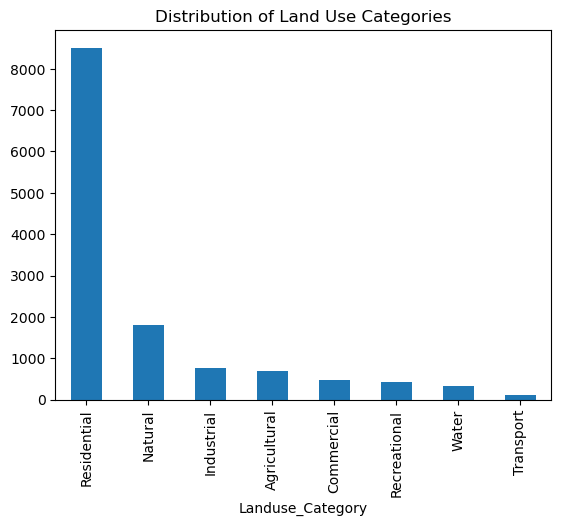

In [97]:
# Create the figure and axis
fig5, ax5 = plt.subplots()

# Get land use counts
land_use_counts = urban_function_df['Landuse_Category'].value_counts()

# Create the bar plot on ax1
land_use_counts.plot(kind='bar', ax=ax5)

# Set title and rotate x-axis labels
ax5.set_title('Distribution of Land Use Categories')
ax5.set_xticks(ax5.get_xticks())  # Get current x-axis labels
ax5.set_xticklabels(ax5.get_xticklabels(), rotation=90)  # Rotate labels

# Show the plot
plt.show()

#### Land Distribution

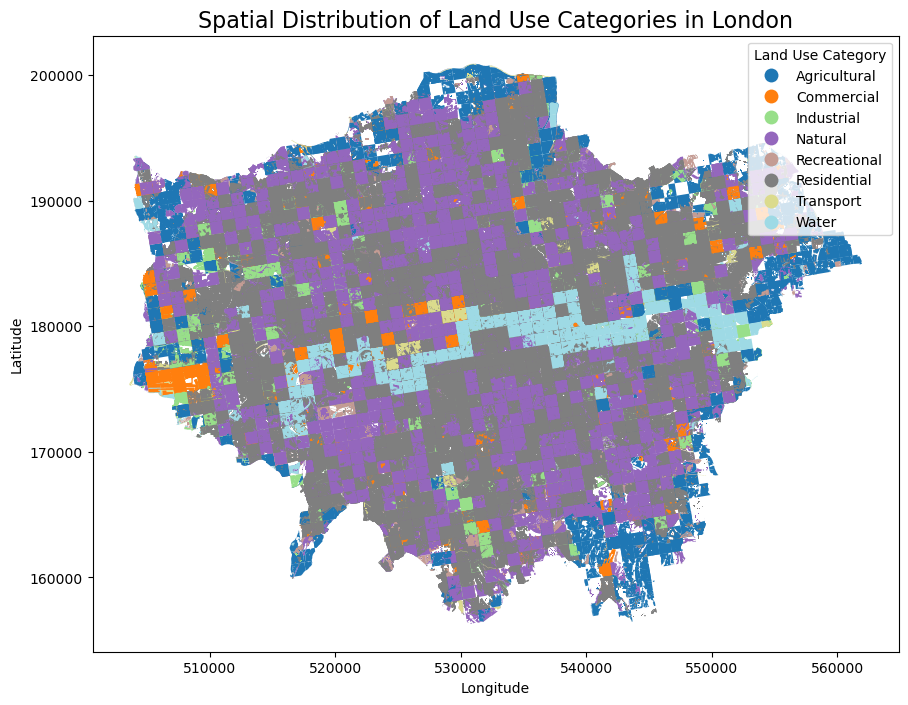

In [98]:
fig6, ax6 = plt.subplots(1, 1, figsize=(12, 8))

# Plot the GeoDataFrame with different colors for each Landuse_Category
urban_function_df.plot(column='Landuse_Category', ax=ax6, legend=True, cmap='tab20', legend_kwds={'title': 'Land Use Category'})

# Set plot title and axis labels
ax6.set_title('Spatial Distribution of Land Use Categories in London', fontsize=16)
ax6.set_xlabel('Longitude')
ax6.set_ylabel('Latitude')

# Show the plot
plt.show()

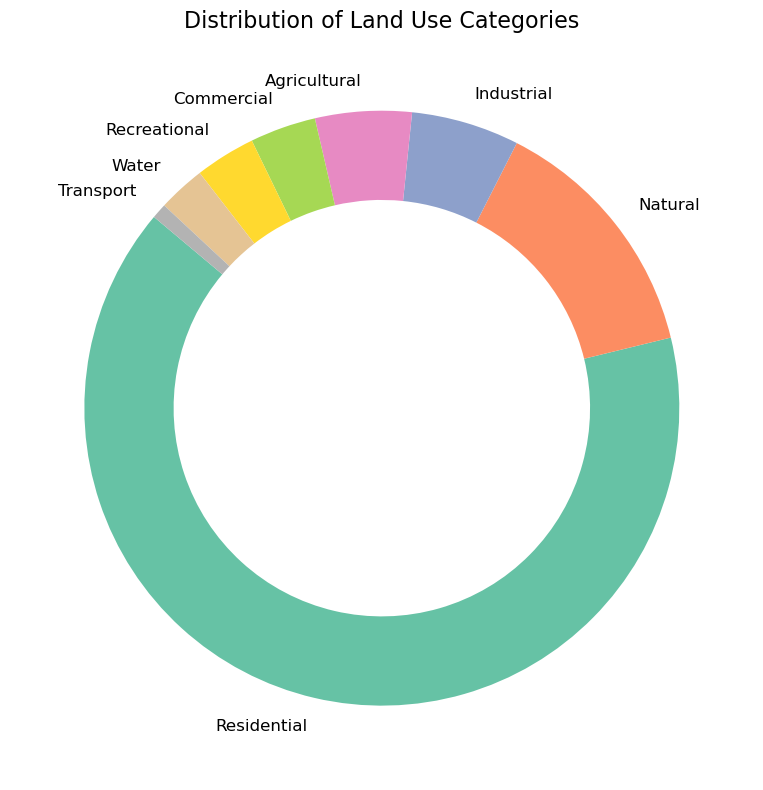

In [99]:
# Count the number of occurrences for each land use category
landuse_counts = urban_function_df['Landuse_Category'].value_counts()

# Create a new figure and axis
fig7, ax7 = plt.subplots(figsize=(10, 8))

# Create a pie chart
wedges, texts, autotexts = ax7.pie(
    landuse_counts,
    labels=landuse_counts.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=plt.get_cmap('Set2').colors,
    wedgeprops=dict(width=0.3)  # Create a donut by setting the width
)

# Format the text
for text in texts:
    text.set_fontsize(12)
for autotext in autotexts:
    autotext.set_fontsize(12)
    autotext.set_color('white')

# Set title
ax7.set_title('Distribution of Land Use Categories', fontsize=16)

# Show the plot
plt.tight_layout()
plt.show()

In [100]:
# Use groupby to get unique counts of 'CELLCODE' for each 'Landuse_Category'
unique_cellcode_counts = urban_function_df.groupby('Landuse_Category')['CELLCODE'].nunique()

# Display the result
print(unique_cellcode_counts)

Landuse_Category
Agricultural     340
Commercial       232
Industrial       390
Natural          965
Recreational     354
Residential     1525
Transport        105
Water            218
Name: CELLCODE, dtype: int64


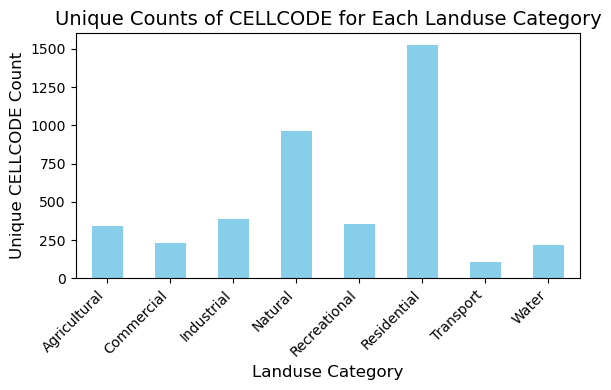

In [101]:
# Plot the unique counts of 'CELLCODE' for each 'Landuse_Category'
plt.figure(figsize=(6, 4))
unique_cellcode_counts.plot(kind='bar', color='skyblue')
# Add title and labels
plt.title('Unique Counts of CELLCODE for Each Landuse Category', fontsize=14)
plt.xlabel('Landuse Category', fontsize=12)
plt.ylabel('Unique CELLCODE Count', fontsize=12)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Display the plot
plt.tight_layout()
plt.show()

### Geo-Spatial Analysis

#### Correlation Analysis

In [102]:
# Define the columns of interest
commercial_columns = ['poi_Commercial Services', 'poi_Retail', 'poi_Accommodation, Eating and Drinking']
transportation_columns = ['busstop_count', 'cycleshare_terminal', 'total_bike_count']

# Calculate correlation between commercial POIs and transportation features
commercial_poi_corr = urban_function_df[commercial_columns + transportation_columns].corr()

# Display the correlation matrix
print("Correlation matrix between commercial services POIs and transportation features:")
commercial_poi_corr

Correlation matrix between commercial services POIs and transportation features:


,poi_Commercial Services,poi_Retail,"poi_Accommodation, Eating and Drinking",busstop_count,cycleshare_terminal,total_bike_count
poi_Commercial Services,1.000000,0.787585,0.883689,0.072634,0.130271,0.095474
poi_Retail,0.787585,1.000000,0.846974,0.086104,0.146354,0.100841
"poi_Accommodation, Eating and Drinking",0.883689,0.846974,1.000000,0.078742,0.157846,0.106765
busstop_count,0.072634,0.086104,0.078742,1.000000,0.082492,0.065377
cycleshare_terminal,0.130271,0.146354,0.157846,0.082492,1.000000,0.869096
total_bike_count,0.095474,0.100841,0.106765,0.065377,0.869096,1.000000


In [103]:
commercial_poi_corr.to_csv("commercial_poi_corr.csv", index=True)

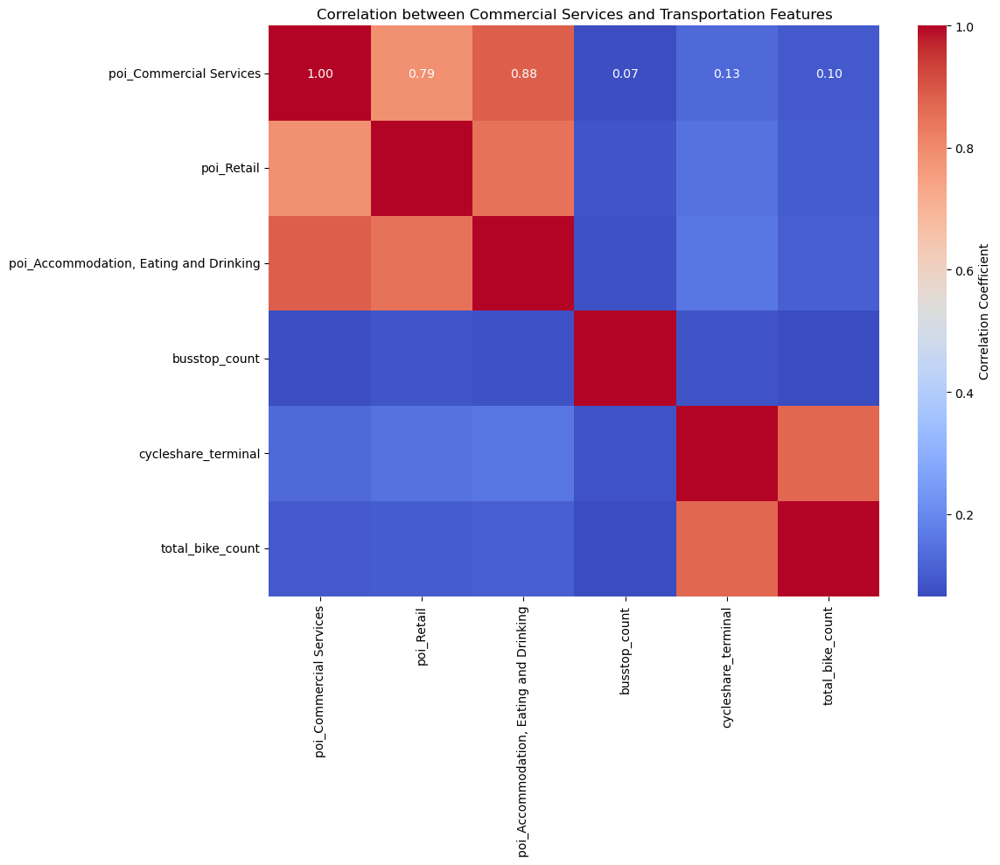

In [104]:
# Create a new figure with one subplot
fig8, ax8 = plt.subplots(figsize=(12, 10))

# Create a heatmap of the correlation matrix
sns.heatmap(commercial_poi_corr, annot=True, cmap='coolwarm', fmt=".2f", ax=ax8, cbar_kws={'label': 'Correlation Coefficient'})

# Set the title
ax8.set_title('Correlation between Commercial Services and Transportation Features')

# Adjust the layout
plt.tight_layout()
plt.show()

In [105]:
import statsmodels.api as sm

In [106]:
# Define transportation and commercial columns
transportation_columns = ['busstop_count', 'cycleshare_terminal', 'total_bike_count']
commercial_columns = ['poi_Commercial Services', 'poi_Retail', 'poi_Accommodation, Eating and Drinking']

# Prepare data for regression for each commercial column
results = {}

# Open a text file to save the results
with open("regression_results.txt", "w") as f:
    for poi in commercial_columns:
        X = urban_function_df[transportation_columns]
        y = urban_function_df[poi]

        # Add constant to the independent variables
        X = sm.add_constant(X)

        # Fit the regression model
        model = sm.OLS(y, X).fit()

        # Store the result in the dictionary
        results[poi] = model

        # Save the regression summary to the file
        f.write(f"Regression results for {poi}:\n")
        f.write(model.summary().as_text())
        f.write("\n" + "-" * 80 + "\n")

        # Display the regression results
        print(f"Regression results for {poi}:\n")
        print(model.summary())
        print("\n" + "-" * 80 + "\n")


Regression results for poi_Commercial Services:

                               OLS Regression Results                              
Dep. Variable:     poi_Commercial Services   R-squared:                       0.022
Model:                                 OLS   Adj. R-squared:                  0.022
Method:                      Least Squares   F-statistic:                     98.55
Date:                     Sun, 18 Aug 2024   Prob (F-statistic):           4.44e-63
Time:                             18:13:10   Log-Likelihood:                -83191.
No. Observations:                    13112   AIC:                         1.664e+05
Df Residuals:                        13108   BIC:                         1.664e+05
Df Model:                                3                                         
Covariance Type:                 nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
-----------------------

#### Hotspot Analysis Using Kernel Density Estimation (KDE)

In [107]:
from scipy.stats import gaussian_kde

In [108]:
# Filter the DataFrame to include only rows where either Commercial Services or Retail POIs are greater than 0
commercial_points = urban_function_df[(urban_function_df['poi_Commercial Services'] > 0) | (urban_function_df['poi_Retail'] > 0) | (urban_function_df['poi_Accommodation, Eating and Drinking'] > 0)].copy()

In [109]:
# Get the centroid of each cell as a representative point for KDE
commercial_points['centroid'] = commercial_points.geometry.centroid
coords = np.array([(point.x, point.y) for point in commercial_points['centroid']])

# Perform KDE
kde = gaussian_kde(coords.T)
x_min, y_min, x_max, y_max = commercial_points.total_bounds
x_grid, y_grid = np.mgrid[x_min:x_max:100j, y_min:y_max:100j]
positions = np.vstack([x_grid.ravel(), y_grid.ravel()])
density = np.reshape(kde(positions).T, x_grid.shape)

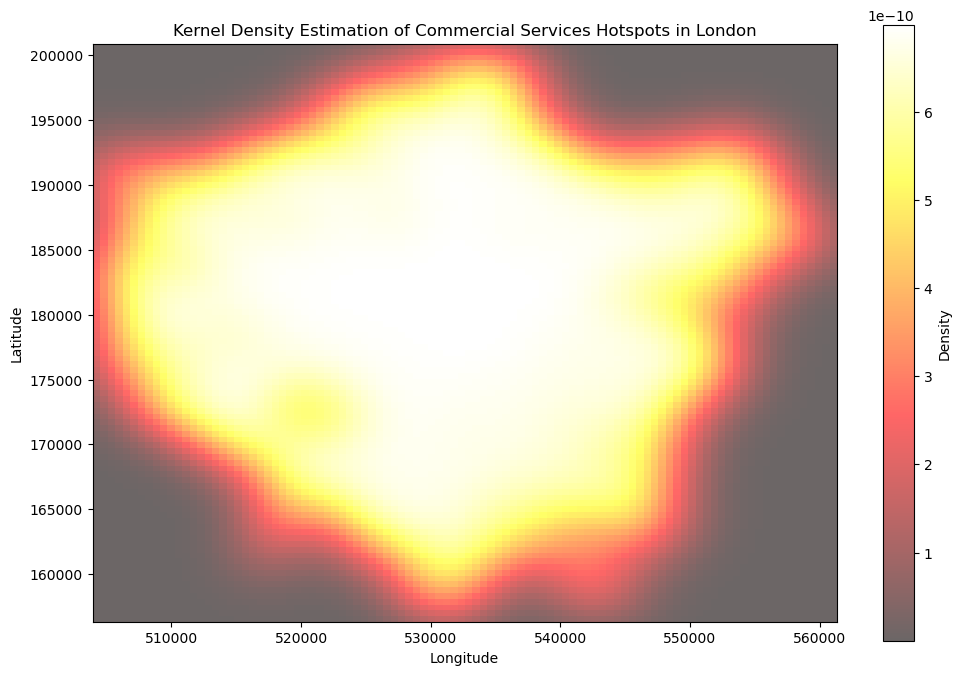

In [110]:
# Plot the density
plt.figure(figsize=(12, 8))
plt.imshow(np.rot90(density), extent=[x_min, x_max, y_min, y_max], cmap='hot', alpha=0.6)
plt.title('Kernel Density Estimation of Commercial Services Hotspots in London')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='Density')
plt.show()

#### POI Density Analysis
###### a. POI Density Against Each Landuse_Category

Calculation: Aggregate all POI columns and calculate density.

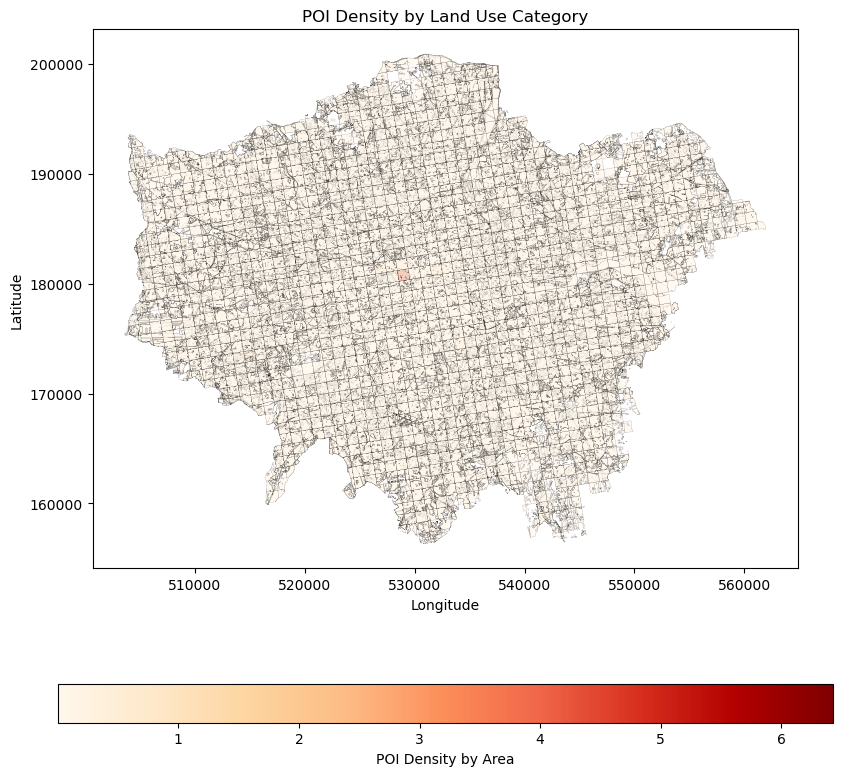

In [111]:
fig9, ax9 = plt.subplots(figsize=(10, 10))
urban_function_df.plot(column='poi_density', ax=ax9, legend=True,
                       cmap='OrRd', edgecolor='k', linewidth=0.1,  # Adjusted linewidth
                       alpha=0.7, legend_kwds={'label': "POI Density by Area",
                                               'orientation': "horizontal"})
ax9.set_title('POI Density by Land Use Category')
ax9.set_xlabel('Longitude')
ax9.set_ylabel('Latitude')
plt.show()

###### b. POI Density for Landuse_Category == Commercial
Filtering and Calculation:

In [112]:
commercial_df = urban_function_df[urban_function_df['Landuse_Category'] == 'Commercial']

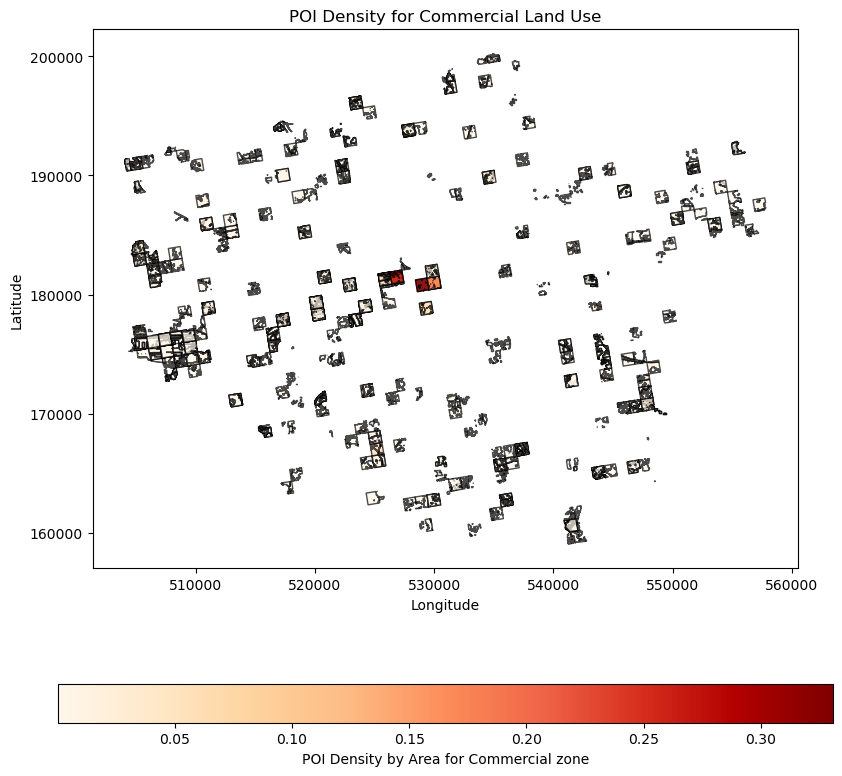

In [113]:
# Plot POI density for Commercial land use
fig10, ax10 = plt.subplots(figsize=(10, 10))
commercial_df.plot(column='poi_density', ax=ax10, legend=True,
                       cmap='OrRd', edgecolor='k', alpha=0.7,
                       legend_kwds={'label': "POI Density by Area for Commercial zone",
                                    'orientation': "horizontal"})
ax10.set_title('POI Density for Commercial Land Use')
ax10.set_xlabel('Longitude')
ax10.set_ylabel('Latitude')
plt.show()

###### 3. Specific POI Analysis for Landuse_Category

Compute poi_density for POIs with tendency of commercial activities

In [114]:
# Sum the relevant POI counts for commercial activities
urban_function_df['total_commercial_poi'] = (
    urban_function_df['poi_Accommodation, Eating and Drinking'] +
    urban_function_df['poi_Attractions'] +
    urban_function_df['poi_Commercial Services'] +
    urban_function_df['poi_Retail']
)

# Calculate poi_density for commercial POIs
urban_function_df['poi_density_commercial'] = urban_function_df['total_commercial_poi'] / urban_function_df['area']

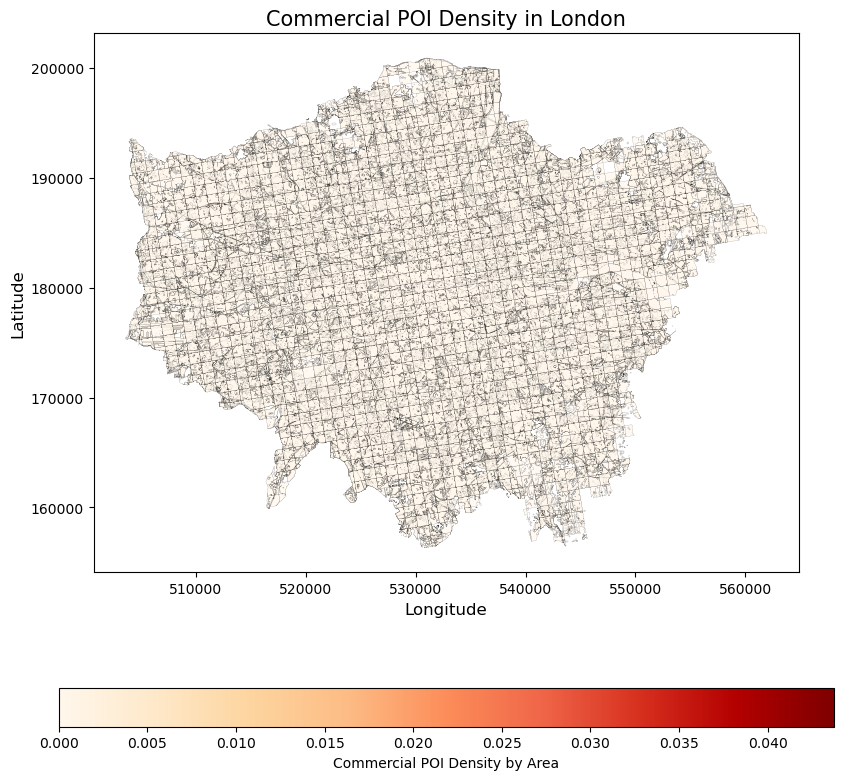

In [115]:
# Create a plot
fig11, ax11 = plt.subplots(1, 1, figsize=(10, 10))

# Plot the GeoDataFrame with poi_density_commercial as the color
# Using a colormap to represent the density
urban_function_df.plot(column='poi_density_commercial', ax=ax11, legend=True,
                       cmap='OrRd', edgecolor='k', linewidth=0.1,  # Adjusted linewidth
                       alpha=0.7, legend_kwds={'label': "Commercial POI Density by Area",
                                               'orientation': "horizontal"})

# Set plot title and labels
ax11.set_title('Commercial POI Density in London', fontsize=15)
ax11.set_xlabel('Longitude', fontsize=12)
ax11.set_ylabel('Latitude', fontsize=12)

# Show the plot
plt.show()

#### Bus Stop Density Analysis
a. Bus Stop Density Against Each Landuse_Category

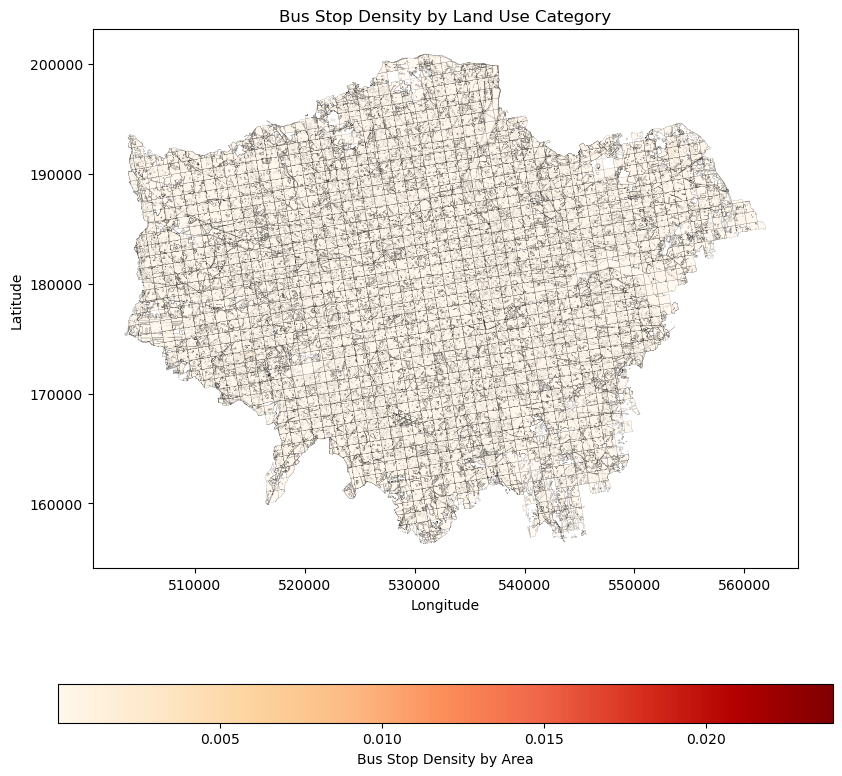

In [116]:
# Plot bus stop density by Landuse_Category with thinner boundary lines
fig12, ax12 = plt.subplots(figsize=(10, 10))
urban_function_df.plot(column='busstop_density', ax=ax12, legend=True,
                       cmap='OrRd', edgecolor='k', linewidth=0.1,  # Adjusted linewidth
                       alpha=0.7, legend_kwds={'label': "Bus Stop Density by Area",
                                               'orientation': "horizontal"})
ax12.set_title('Bus Stop Density by Land Use Category')
ax12.set_xlabel('Longitude')
ax12.set_ylabel('Latitude')
plt.show()

###### b. Bus Stop Density in Land use commercial Area

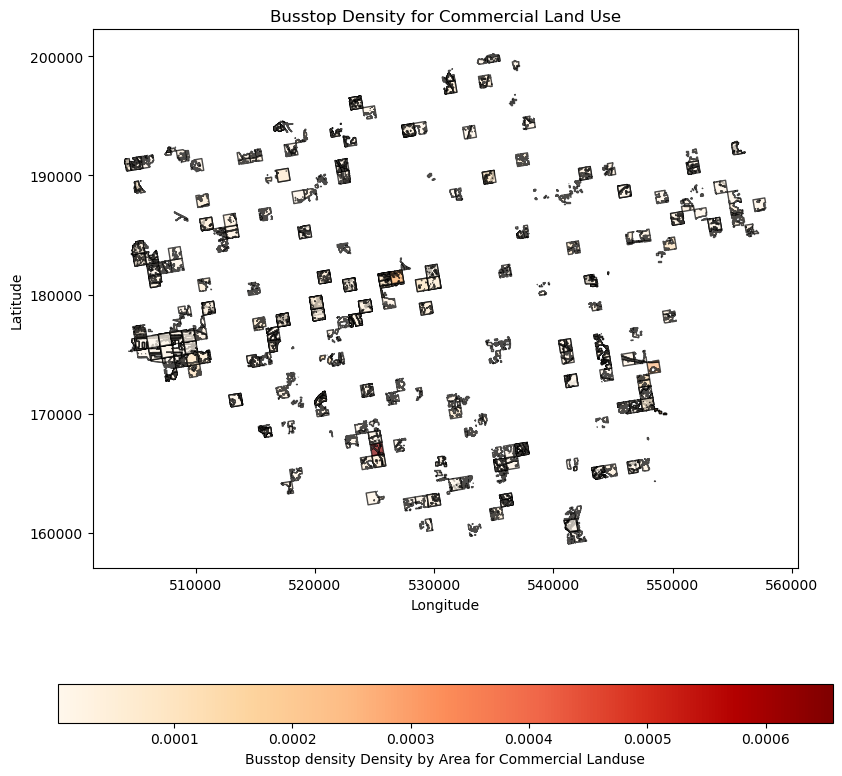

In [117]:
# Plot POI density for Commercial land use
fig13, ax13 = plt.subplots(figsize=(10, 10))
commercial_df.plot(column='busstop_density', ax=ax13, legend=True,
                       cmap='OrRd', edgecolor='k', alpha=0.7,
                       legend_kwds={'label': "Busstop density Density by Area for Commercial Landuse",
                                    'orientation': "horizontal"})
ax13.set_title('Busstop Density for Commercial Land Use')
ax13.set_xlabel('Longitude')
ax13.set_ylabel('Latitude')
plt.show()

#### Spatial Pattern Analysis
Objective: Identify clusters of POIs, bus stops, or cycle share stations and explore spatial relationships.

###### CLustering Analysis

In [118]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, davies_bouldin_score

In [119]:
# Select relevant columns for clustering
features = urban_function_df[[
    'poi_Accommodation, Eating and Drinking',
    'poi_Attractions',
    'poi_Commercial Services',
    'poi_Education and Health',
    'poi_Manufacturing and Production',
    'poi_Public Infrastructure',
    'poi_Retail',
    'poi_Sport and Entertainment',
    'poi_Transport',
    'busstop_count',
    'cycleshare_terminal',
    'total_bike_count'
]]

# Scale the features
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features)

# Generate centroids for the polygons
urban_function_df['centroid'] = urban_function_df.geometry.centroid

#### K-Means Clustering

In [120]:
# Perform KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=42, n_init =10 )
urban_function_df['kmeans_cluster'] = kmeans.fit_predict(features_scaled)

In [121]:
# Calculate Silhouette Coefficient
silhouette_avg = silhouette_score(features_scaled, urban_function_df['kmeans_cluster'])
print(f"Silhouette Coefficient: {silhouette_avg:.2f}")

# Calculate Davies-Bouldin Index
davies_bouldin = davies_bouldin_score(features_scaled, urban_function_df['kmeans_cluster'])
print(f"Davies-Bouldin Index: {davies_bouldin:.2f}")

Silhouette Coefficient: 0.49
Davies-Bouldin Index: 0.98


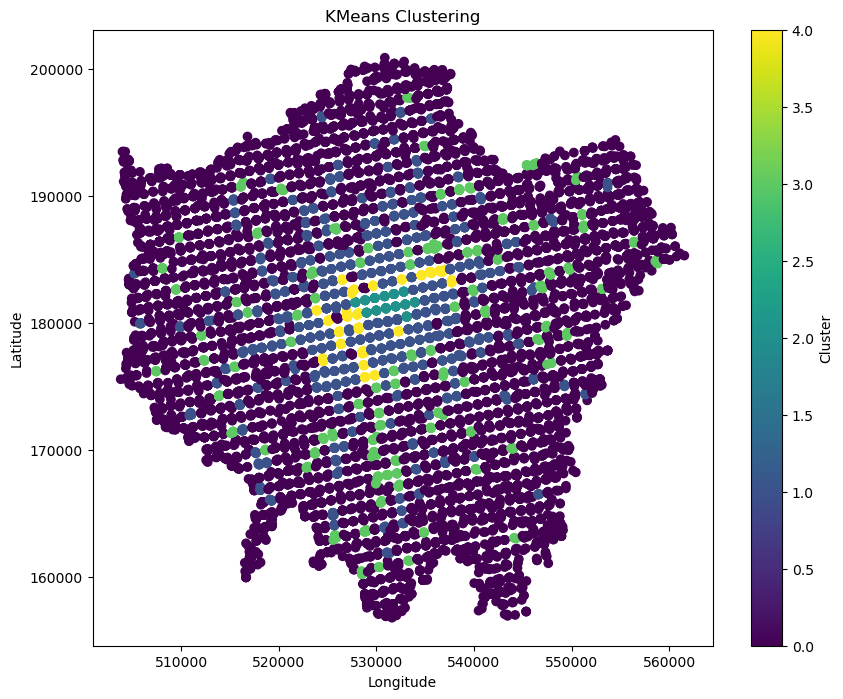

In [122]:
# Visualize KMeans clustering
fig15, ax15 = plt.subplots(1, 1, figsize=(10, 8))
scatter = ax15.scatter(urban_function_df.centroid.x, urban_function_df.centroid.y, c=urban_function_df['kmeans_cluster'], cmap='viridis')
ax15.set_title('KMeans Clustering')
ax15.set_xlabel('Longitude')
ax15.set_ylabel('Latitude')
colorbar = fig.colorbar(scatter, ax=ax15, label='Cluster')
plt.show()

##### DBScan

In [123]:
from sklearn.cluster import DBSCAN

In [124]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.5, min_samples=5)
urban_function_df['dbscan_cluster'] = dbscan.fit_predict(features_scaled)

In [125]:
# Filter out noise points for metric calculations
non_noise_mask = urban_function_df['dbscan_cluster'] != -1
features_non_noise = features_scaled[non_noise_mask]
labels_non_noise = urban_function_df['dbscan_cluster'][non_noise_mask]

# Calculate Silhouette Coefficient
if len(set(labels_non_noise)) > 1:  # Ensure there are at least 2 clusters
    silhouette_avg_dbscan = silhouette_score(features_non_noise, labels_non_noise)
    print(f"Silhouette Coefficient (DBSCAN): {silhouette_avg_dbscan:.2f}")
else:
    print("Silhouette Coefficient (DBSCAN): Not applicable, only one cluster found.")

# Calculate Davies-Bouldin Index
if len(set(labels_non_noise)) > 1:  # Ensure there are at least 2 clusters
    davies_bouldin_dbscan = davies_bouldin_score(features_non_noise, labels_non_noise)
    print(f"Davies-Bouldin Index (DBSCAN): {davies_bouldin_dbscan:.2f}")
else:
    print("Davies-Bouldin Index (DBSCAN): Not applicable, only one cluster found.")

Silhouette Coefficient (DBSCAN): 0.23
Davies-Bouldin Index (DBSCAN): 0.37


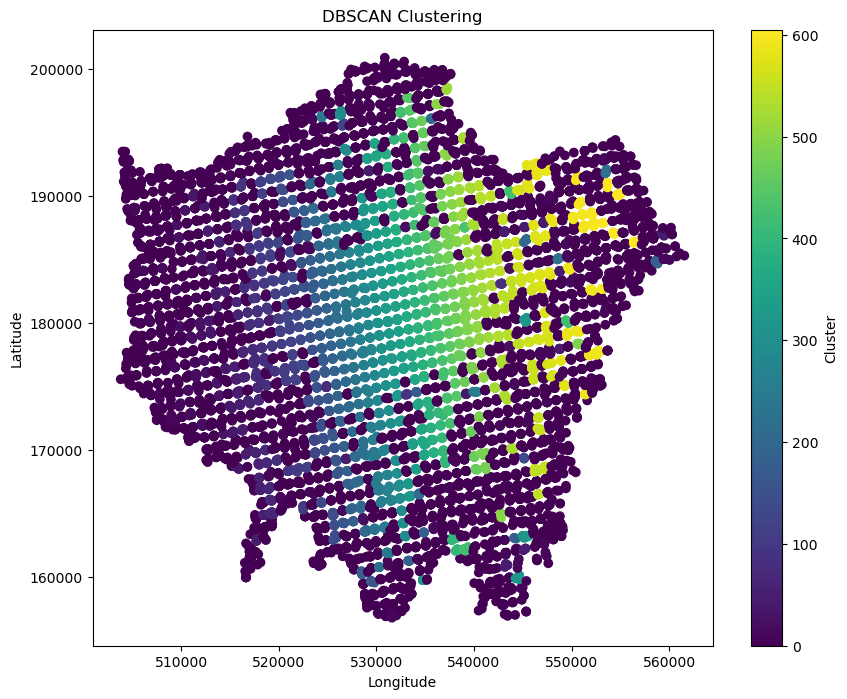

In [126]:
# Visualize DBSCAN clustering
fig16, ax16 = plt.subplots(1, 1, figsize=(10, 8))
scatter = ax16.scatter(urban_function_df.centroid.x, urban_function_df.centroid.y, c=urban_function_df['dbscan_cluster'], cmap='viridis')
ax16.set_title('DBSCAN Clustering')
ax16.set_xlabel('Longitude')
ax16.set_ylabel('Latitude')
colorbar = fig.colorbar(scatter, ax=ax16, label='Cluster')
plt.show()

In [127]:
# Filter for commercial areas
commercial_clusters = urban_function_df[urban_function_df['Landuse_Category'] == 'Commercial']

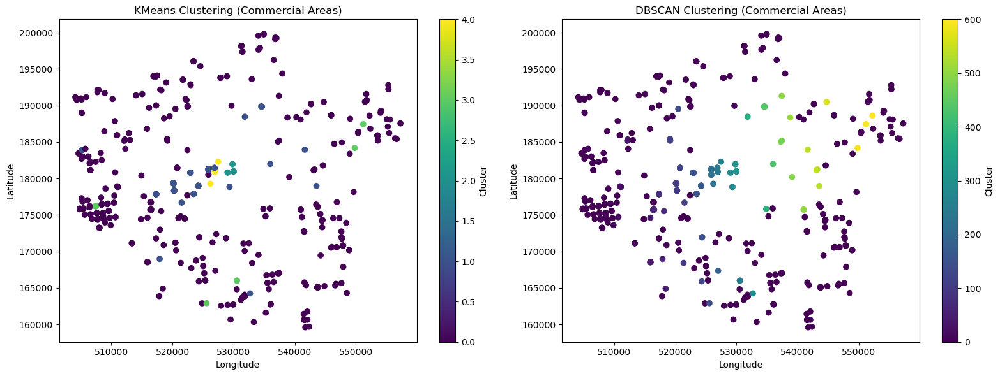

In [148]:
# Plotting KMeans and DBSCAN clusters for commercial areas
fig14, (ax_1, ax_2) = plt.subplots(1, 2, figsize=(16, 6))

# KMeans Clustering
scatter_1 = ax_1.scatter(commercial_clusters.centroid.x, commercial_clusters.centroid.y, c=commercial_clusters['kmeans_cluster'], cmap='viridis')
ax_1.set_xlabel('Longitude')
ax_1.set_ylabel('Latitude')
ax_1.set_title('KMeans Clustering (Commercial Areas)')
colorbar_1 = fig15.colorbar(scatter_1, ax=ax_1, label='Cluster')

# DBSCAN Clustering
scatter_2 = ax_2.scatter(commercial_clusters.centroid.x, commercial_clusters.centroid.y, c=commercial_clusters['dbscan_cluster'], cmap='viridis')
ax_2.set_xlabel('Longitude')
ax_2.set_ylabel('Latitude')
ax_2.set_title('DBSCAN Clustering (Commercial Areas)')
colorbar_2 = fig15.colorbar(scatter_2, ax=ax_2, label='Cluster')

plt.tight_layout()
plt.show()

##### Urban Function Analysis
Objective: Determine urban functions based on POI distribution and analyze their accessibility

###### Analyze Land Use and Urban Function Relationship:

Cross-Tabulation:

In [129]:
landuse_function_df = urban_function_df[['Landuse_Category', 'poi_Commercial Services', 'poi_Retail', 'poi_Accommodation, Eating and Drinking',
                                        'busstop_count','cycleshare_terminal', 'total_bike_count']].groupby('Landuse_Category').mean()
landuse_function_df

,poi_Commercial Services,poi_Retail,"poi_Accommodation, Eating and Drinking",busstop_count,cycleshare_terminal,total_bike_count
Landuse_Category,,,,,,
Agricultural,12.986900,4.211063,2.813683,1.184862,0.008734,0.192140
Commercial,77.251064,29.378723,31.331915,1.259574,0.010638,0.134043
Industrial,53.612987,21.716883,12.761039,1.206494,0.003896,0.074026
Natural,75.217827,28.624513,26.095822,1.150418,0.037883,0.470195
Recreational,31.071926,12.262181,8.039443,1.366589,0.016241,0.220418
Residential,82.025960,32.522965,27.908375,1.689299,0.019500,0.215200
Transport,102.009259,40.981481,38.000000,1.185185,0.037037,0.370370
Water,100.082840,25.556213,35.165680,1.337278,0.005917,0.071006


###### Assess Accessibility of Urban Functions:

Accessibility Distribution

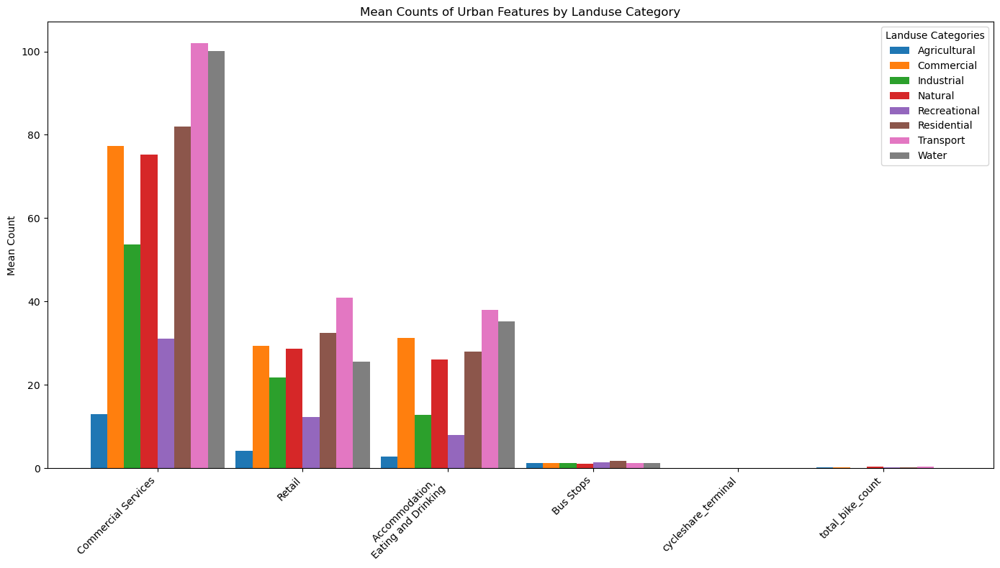

In [130]:
# Create labels and data for the plot
labels = ['Commercial Services', 'Retail', 'Accommodation, \nEating and Drinking', 'Bus Stops', 'cycleshare_terminal', 'total_bike_count']
categories = landuse_function_df.index
data = landuse_function_df.values

# Create the plot
fig18, ax18 = plt.subplots(figsize=(14, 8))

# Number of categories and features
num_categories = len(categories)
num_features = len(labels)

# Set width of bar
bar_width = 0.15

# Set positions of bars on x-axis
positions = np.arange(num_features) * (bar_width * num_categories + 0.1)  # Adjusted to add space between groups
bar_positions = [positions + i * bar_width for i in range(num_categories)]

# Plot each category
for i, category in enumerate(categories):
    ax18.bar(bar_positions[i], data[i], bar_width, label=category)

# Customize the plot
ax18.set_ylabel('Mean Count')
ax18.set_title('Mean Counts of Urban Features by Landuse Category')
ax18.set_xticks(positions + bar_width * (num_categories - 1) / 2)
ax18.set_xticklabels(labels)

# Rotate and align the tick labels so they look better
plt.setp(ax18.get_xticklabels(), rotation=45, ha='right')

# Add legend
ax18.legend(title='Landuse Categories')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

##### Distribution and intensity of commercial POIs along with different land use categories,

In [131]:
import matplotlib.patches as mpatches
import matplotlib.colorbar as colorbar
import matplotlib.colors as mcolors

#### Analyze Commercial Land Use by Land Use Category
Compare the commercial activity across different land use categories to understand where commercial activities are most prevalent.

<Axes: xlabel='Landuse_Category'>

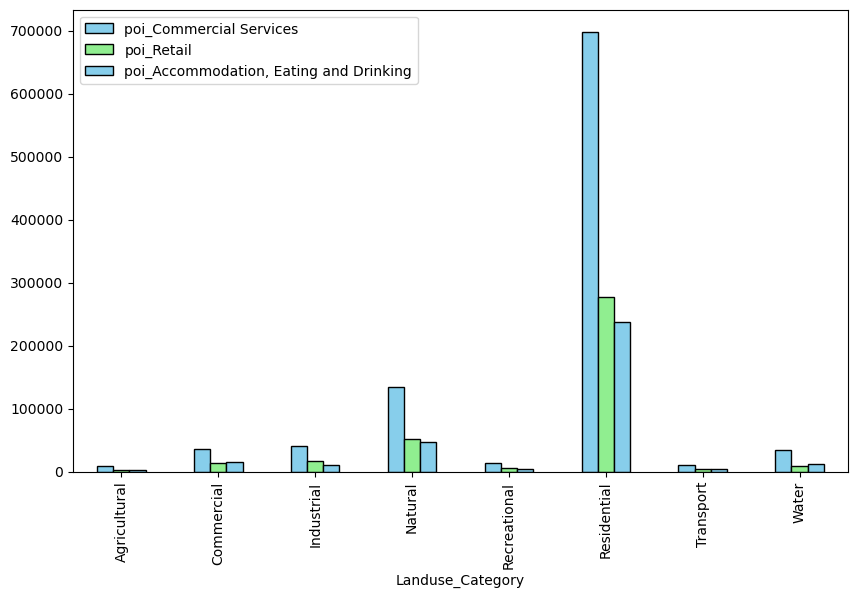

In [132]:
# Group by Landuse_Category and sum both commercial and retail POIs
commercial_by_landuse = urban_function_df.groupby('Landuse_Category')[['poi_Commercial Services', 'poi_Retail', 'poi_Accommodation, Eating and Drinking']].sum().reset_index()

# Plot commercial POIs by land use category
fig19, ax19 = plt.subplots(figsize=(10, 6))

# Plot both commercial and retail POIs
commercial_by_landuse.plot(
    kind='bar', 
    x='Landuse_Category', 
    y=['poi_Commercial Services', 'poi_Retail', 'poi_Accommodation, Eating and Drinking'], 
    ax=ax19, 
    color=['skyblue', 'lightgreen'],
    edgecolor='k'
)

In [133]:
# Sum the relevant POI counts for commercial activities
# Create a boolean mask for places with any commercial POIs
commercial_pois_mask = (
    (urban_function_df['poi_Accommodation, Eating and Drinking'] +
    urban_function_df['poi_Attractions'] +
    urban_function_df['poi_Commercial Services'] +
    urban_function_df['poi_Retail']) > 0
)

# Create a GeoDataFrame for commercial POIs for plotting
commercial_pois = urban_function_df[commercial_pois_mask]

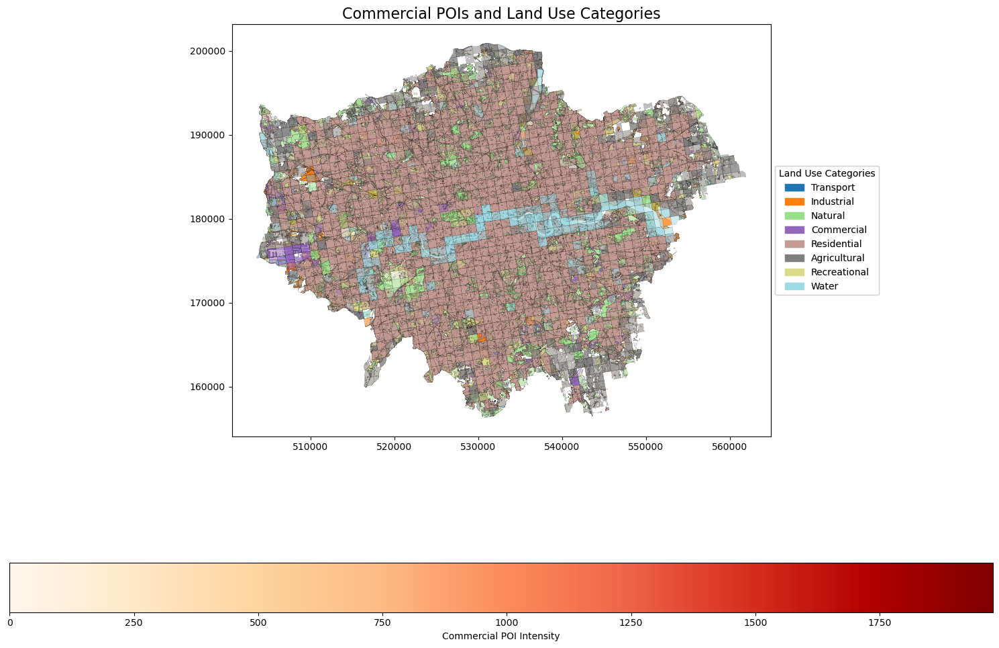

In [134]:
# Create a figure and axis
fig20, ax20 = plt.subplots(figsize=(15, 10))

# Plot the commercial POIs with thinner boundary lines
commercial_pois_plot = commercial_pois.plot(
    column='poi_Commercial Services',  # Ensure this column exists
    cmap='OrRd', 
    alpha=0.7, 
    edgecolor='k', 
    linewidth=0.1,  # Adjusted linewidth
    legend=False,  # Turn off legend to add custom colorbar later
    ax=ax20
)

# Add a colorbar below the plot
norm = plt.Normalize(vmin=commercial_pois['poi_Commercial Services'].min(), vmax=commercial_pois['poi_Commercial Services'].max())
sm = plt.cm.ScalarMappable(cmap='OrRd', norm=norm)
sm.set_array([])

cbar = fig20.colorbar(sm, ax=ax20, orientation='horizontal', pad=0.2)
cbar.set_label('Commercial POI Intensity')

# Plot land use categories with thinner boundary lines
landuse_legend = urban_function_df['Landuse_Category'].unique()
colors = plt.get_cmap('tab20', len(landuse_legend))

# Create a list of patches for the legend
landuse_patches = []
for landuse in landuse_legend:
    subset = urban_function_df[urban_function_df['Landuse_Category'] == landuse]
    subset.plot(
        ax=ax20, 
        edgecolor='k', 
        linewidth=0.1,  # Adjusted linewidth
        color=colors(landuse_legend.tolist().index(landuse)),
        alpha=0.5
    )
    # Add a patch for each land use category to the custom legend
    landuse_patches.append(mpatches.Patch(color=colors(landuse_legend.tolist().index(landuse)), label=landuse))

# Create the land use category legend using the patches
landuse_legend = ax20.legend(handles=landuse_patches, loc='center left', bbox_to_anchor=(1, 0.5), title='Land Use Categories')

# Add the land use category legend to the plot
ax20.add_artist(landuse_legend)

# Set the title and adjust the layout
ax20.set_title('Commercial POIs and Land Use Categories', fontsize=16)
plt.tight_layout()

# Display the plot
plt.show()

#### Assess Accessibility to Commercial Areas

###### Buffer Analysis Around Commercial POIs

In [135]:
import networkx as nx
import random
from scipy.spatial import KDTree
import matplotlib.patches as mpatches

In [136]:
road_gdf = gpd.read_file(r"C:\Users\user\Downloads\greater-london-latest-free.shp\gis_osm_roads_free_1.shp")

# Print the info about the GeoDataFrame
print(road_gdf.info())

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 481265 entries, 0 to 481264
Data columns (total 11 columns):
 #   Column    Non-Null Count   Dtype   
---  ------    --------------   -----   
 0   osm_id    481265 non-null  object  
 1   code      481265 non-null  int64   
 2   fclass    481265 non-null  object  
 3   name      165040 non-null  object  
 4   ref       36944 non-null   object  
 5   oneway    481265 non-null  object  
 6   maxspeed  481265 non-null  int64   
 7   layer     481265 non-null  int64   
 8   bridge    481265 non-null  object  
 9   tunnel    481265 non-null  object  
 10  geometry  481265 non-null  geometry
dtypes: geometry(1), int64(3), object(7)
memory usage: 40.4+ MB
None


<Axes: >

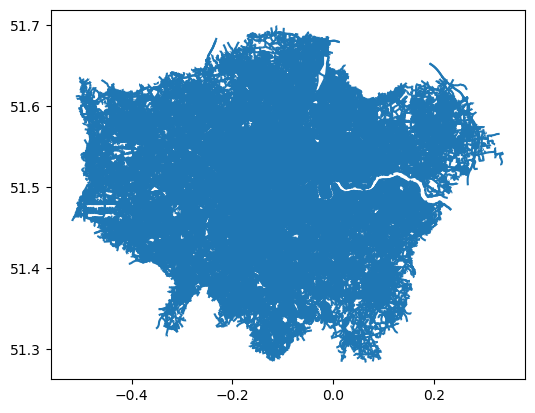

In [137]:
road_gdf.plot()

In [138]:
# Check for conflicting column names and rename them
conflict_cols = {'index_left', 'index_right'}
urban_function_df.columns = [f"{col}_left" if col in conflict_cols else col for col in urban_function_df.columns]
road_gdf.columns = [f"{col}_right" if col in conflict_cols else col for col in road_gdf.columns]

# Ensure both GeoDataFrames use the same CRS
if urban_function_df.crs != road_gdf.crs:
    road_gdf = road_gdf.to_crs(urban_function_df.crs)

# Perform the spatial join
road_urban_data = gpd.sjoin(urban_function_df, road_gdf, how='left', predicate='intersects')

# Output information about the joined GeoDataFrame
road_urban_data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 3573699 entries, 0 to 13111
Data columns (total 42 columns):
 #   Column                                  Dtype   
---  ------                                  -----   
 0   CELLCODE                                object  
 1   groupname                               object  
 2   landuse_de                              object  
 3   index_right_left                        float64 
 4   name_left                               object  
 5   categoryname                            object  
 6   classname                               object  
 7   pos_accuracy                            float64 
 8   poi_Accommodation, Eating and Drinking  float64 
 9   poi_Attractions                         float64 
 10  poi_Commercial Services                 float64 
 11  poi_Education and Health                float64 
 12  poi_Manufacturing and Production        float64 
 13  poi_Public Infrastructure               float64 
 14  poi_Retail       

In [139]:
road_urban_data.head()

,CELLCODE,groupname,landuse_de,index_right_left,name_left,categoryname,classname,pos_accuracy,"poi_Accommodation, Eating and Drinking",poi_Attractions,...,osm_id,code,fclass,name_right,ref,oneway,maxspeed,layer,bridge,tunnel
0,1kmE3593N3203,Transport,Principle Transport,313784.0,Bridge,Road and Rail,Bridges,2.0,0.0,0.0,...,1096580,5131.0,motorway_link,NaN,M25,F,112.0,0.0,F,F
0,1kmE3593N3203,Transport,Principle Transport,313784.0,Bridge,Road and Rail,Bridges,2.0,0.0,0.0,...,159268097,5115.0,tertiary,Horton Road,NaN,F,96.0,0.0,F,F
0,1kmE3593N3203,Transport,Principle Transport,313784.0,Bridge,Road and Rail,Bridges,2.0,0.0,0.0,...,83822868,5112.0,trunk,Poyle Interchange,NaN,F,96.0,0.0,F,F
0,1kmE3593N3203,Transport,Principle Transport,313784.0,Bridge,Road and Rail,Bridges,2.0,0.0,0.0,...,83822859,5112.0,trunk,Poyle Interchange,NaN,F,96.0,0.0,F,F
0,1kmE3593N3203,Transport,Principle Transport,313784.0,Bridge,Road and Rail,Bridges,2.0,0.0,0.0,...,159268094,5115.0,tertiary,Horton Road,NaN,F,96.0,0.0,F,F


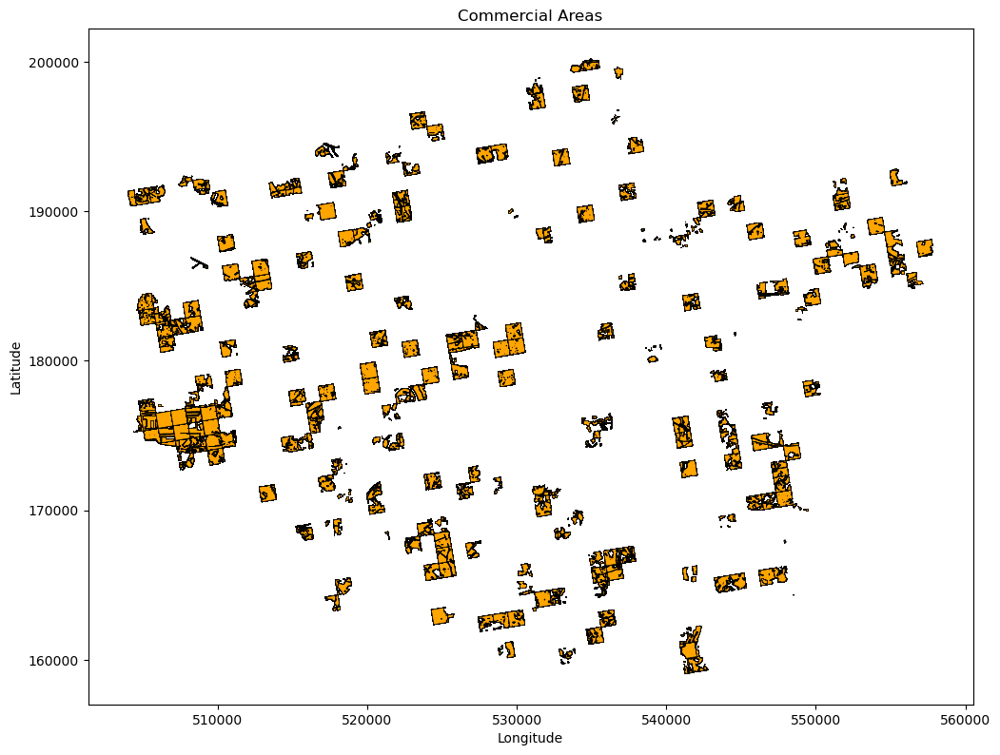

In [140]:
# Filter for commercial land use
commercial_data = road_urban_data[road_urban_data['Landuse_Category'] == 'Commercial']

# Plot commercial areas
fig21, ax21 = plt.subplots(figsize=(12, 10))
commercial_data.plot(ax=ax21, color='orange', edgecolor='black', linewidth=0.5)
plt.title("Commercial Areas")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

C:\Users\user\anaconda3\Lib\site-packages\geopandas\geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


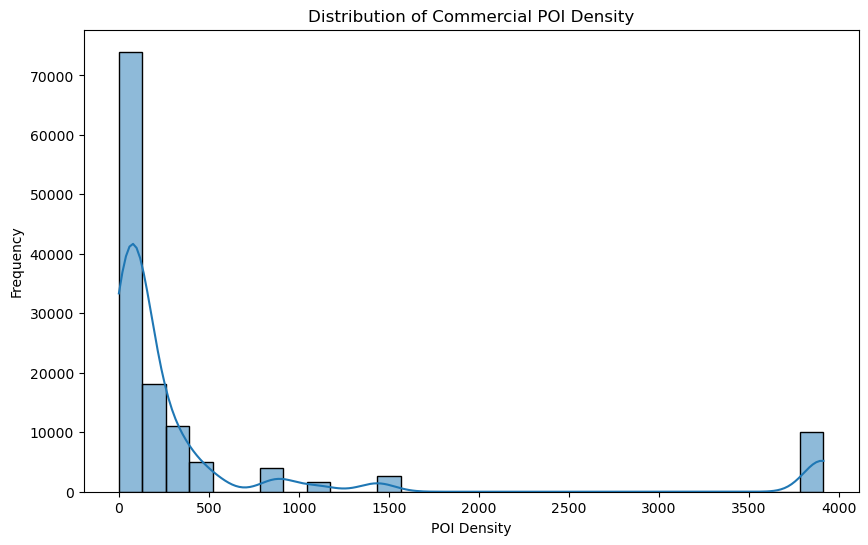

In [141]:
# Calculate POI density for commercial areas
commercial_data['poi_density_commercial'] = (
    commercial_data['poi_Accommodation, Eating and Drinking'] +
    commercial_data['poi_Attractions'] +
    commercial_data['poi_Commercial Services'] +
    commercial_data['poi_Retail']
)

# Visualize POI density
plt.figure(figsize=(10, 6))
sns.histplot(commercial_data['poi_density_commercial'], bins=30, kde=True)
plt.title("Distribution of Commercial POI Density")
plt.xlabel("POI Density")
plt.ylabel("Frequency")
plt.show()

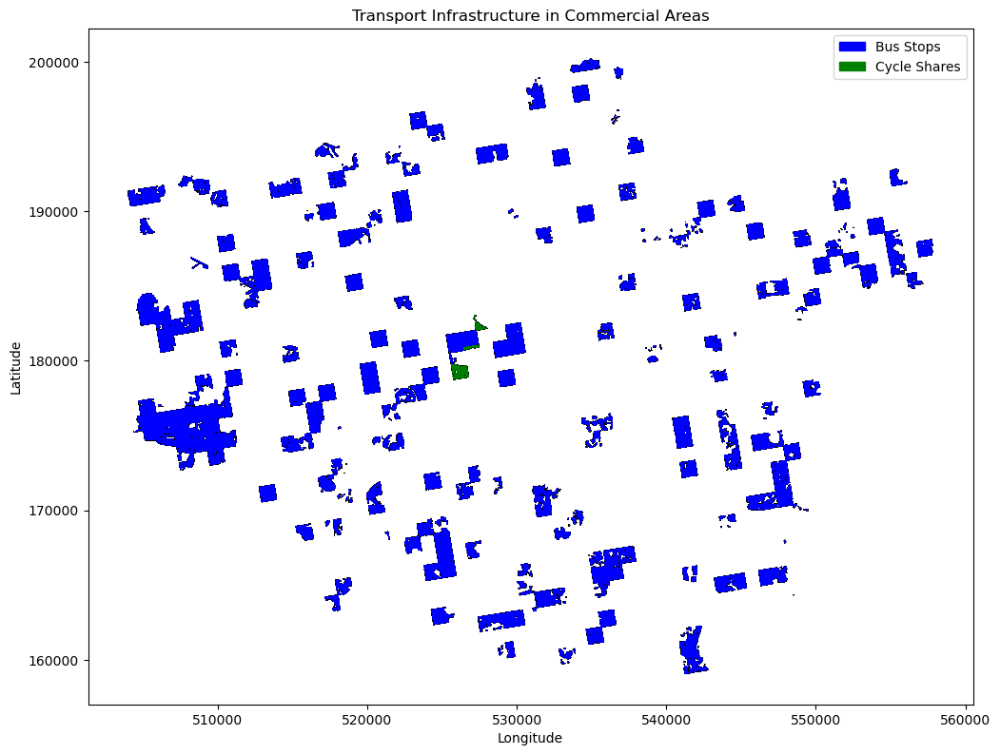

In [149]:
# Visualize the transport infrastructure in commercial areas
fig22, ax22 = plt.subplots(figsize=(12, 10))
commercial_data.plot(ax=ax22, color='lightgrey', edgecolor='black', linewidth=0.5, label='_nolegend_')

# Plot bus stops
bus_stops = commercial_data[commercial_data['busstop_count'] > 0]
bus_stops.plot(ax=ax22, color='blue', markersize=10, label='Bus Stops', alpha=0.6)

# Plot cycle share terminals
cycle_shares = commercial_data[commercial_data['cycleshare_terminal'] > 0]
cycle_shares.plot(ax=ax22, color='green', markersize=10, label='Cycle Shares', alpha=0.6)

# Create custom legend
bus_patch = mpatches.Patch(color='blue', label='Bus Stops')
cycle_patch = mpatches.Patch(color='green', label='Cycle Shares')
ax22.legend(handles=[bus_patch, cycle_patch], loc='upper right')

plt.title("Transport Infrastructure in Commercial Areas")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

In [143]:
# Calculate POI density for commercial areas
urban_function_df['poi_density_commercial'] = (
    urban_function_df['poi_Accommodation, Eating and Drinking'] +
    urban_function_df['poi_Attractions'] +
    urban_function_df['poi_Commercial Services'] +
    urban_function_df['poi_Retail']
)

In [144]:
# Using the mean as the threshold
threshold_value = urban_function_df['poi_density_commercial'].mean()

# Select commercial areas with high POI density
high_density_commercial = urban_function_df[urban_function_df['poi_density_commercial'] > threshold_value]

# Create a buffer around these high-density commercial areas ( 500 meters)
high_density_commercial['buffer'] = high_density_commercial['geometry'].buffer(500)

# Select transport-related features (e.g., bus stops) for spatial analysis
transport_gdf = urban_function_df[urban_function_df['busstop_count'] > 0]

# Perform a spatial join to find which transport points are within the buffer of high-density commercial zones
transport_near_commercial = gpd.sjoin(transport_gdf, high_density_commercial, how='inner', predicate='within')

C:\Users\user\anaconda3\Lib\site-packages\geopandas\geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [145]:
transport_near_commercial.head()

,CELLCODE_left,groupname_left,landuse_de_left,index_right_left_left,name_left,categoryname_left,classname_left,pos_accuracy_left,"poi_Accommodation, Eating and Drinking_left",poi_Attractions_left,...,total_commercial_poi_right,poi_total_right,poi_density_right,busstop_density_right,area_right,poi_density_commercial_right,centroid_right,kmeans_cluster_right,dbscan_cluster_right,buffer
114,1kmE3596N3207,"Accommodation, Eating and Drinking",High density residential with retail and comme...,346356.0,Butties,Eating and Drinking,"Cafes, Snack Bars and Tea Rooms",1.0,44.0,2.0,...,222.0,337.0,0.003041,0.000009,10542375.45,222.0,POINT (505861.370 179977.779),1,3,"POLYGON ((504777.147 180018.729, 504772.912 18..."
115,1kmE3596N3207,Attractions,Low density residential with amenities (suburb...,311393.0,Play Area,Recreational,Playgrounds,2.0,44.0,2.0,...,222.0,337.0,0.003041,0.000009,10542375.45,222.0,POINT (505861.370 179977.779),1,3,"POLYGON ((504777.147 180018.729, 504772.912 18..."
120,1kmE3596N3207,Retail,High density residential with retail and comme...,135518.0,Best Food & Wine,"Food, Drink and Multi Item Retail",Alcoholic Drinks Including Off Licences and Wh...,1.0,44.0,2.0,...,222.0,337.0,0.003041,0.000009,10542375.45,222.0,POINT (505861.370 179977.779),1,3,"POLYGON ((504777.147 180018.729, 504772.912 18..."
115,1kmE3596N3207,Attractions,Low density residential with amenities (suburb...,311393.0,Play Area,Recreational,Playgrounds,2.0,44.0,2.0,...,222.0,337.0,0.000801,0.000002,456569.09,222.0,POINT (505753.065 179939.669),1,3,"POLYGON ((504777.147 180018.729, 504772.912 18..."
115,1kmE3596N3207,Attractions,Low density residential with amenities (suburb...,311393.0,Play Area,Recreational,Playgrounds,2.0,44.0,2.0,...,222.0,337.0,0.003041,0.000009,5033199.23,222.0,POINT (505862.129 179977.921),1,3,"POLYGON ((504777.147 180018.729, 504772.912 18..."


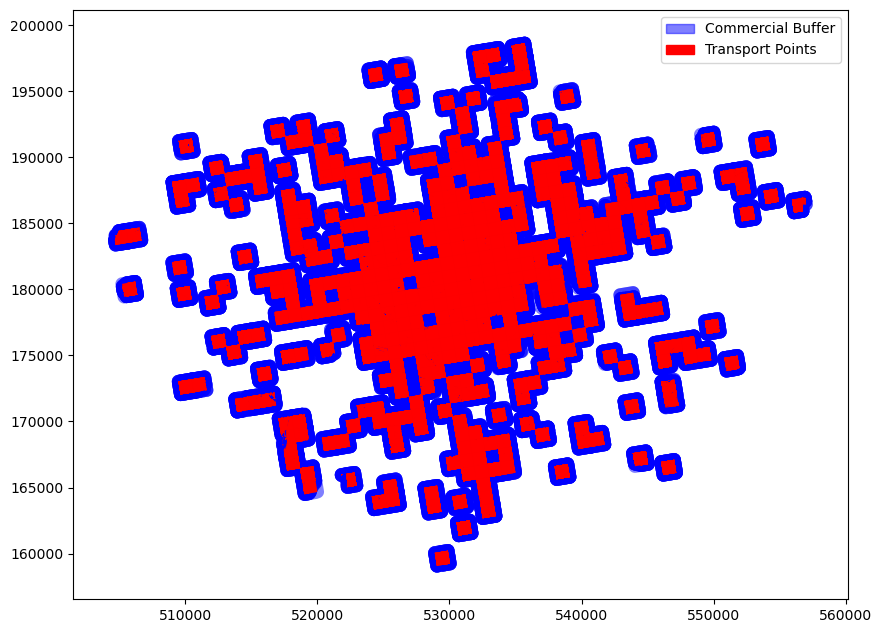

In [146]:
# Plot the high-density commercial buffers and transport points
fig23, ax23 = plt.subplots(figsize=(10, 10))

# Plot high-density commercial buffer with blue color
high_density_commercial['buffer'].plot(ax=ax23, color='blue', alpha=0.5, label='_nolegend_')

# Plot transport points with red color
transport_near_commercial.plot(ax=ax23, color='red', label='_nolegend_')

# Manually create legend handles
commercial_patch = mpatches.Patch(color='blue', alpha=0.5, label='Commercial Buffer')
transport_patch = mpatches.Patch(color='red', label='Transport Points')

# Add the custom legend
plt.legend(handles=[commercial_patch, transport_patch])

plt.show()

C:\Users\user\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


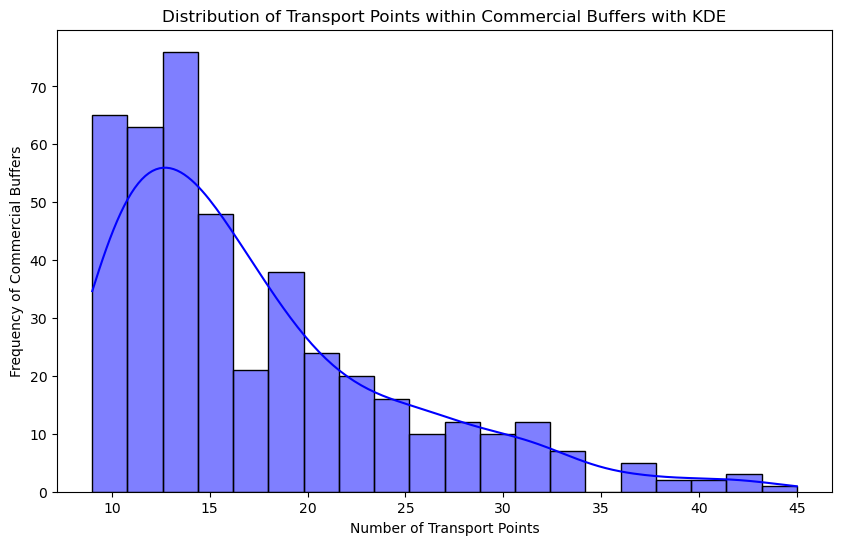

In [147]:
# Count the number of transport points within each buffer zone
transport_point_counts = transport_near_commercial.groupby('CELLCODE_left').size()

# Replace infinite values (if any) with NaN, and then drop them
transport_point_counts = transport_point_counts.replace([np.inf, -np.inf], np.nan).dropna()

# Plot histogram with KDE curve
fig24, ax24 = plt.subplots(figsize=(10, 6))
sns.histplot(transport_point_counts, bins=20, kde=True, color='blue', ax=ax24)

# Set the title and labels
ax24.set_title('Distribution of Transport Points within Commercial Buffers with KDE')
ax24.set_xlabel('Number of Transport Points')
ax24.set_ylabel('Frequency of Commercial Buffers')

# Show the plot
plt.show()

#### Save my Pictures

In [150]:
#a function to save the images
def save_image(fig, filename):
    if not os.path.exists("Data Viz"):
        os.makedirs("Data Viz")
    images_path = os.path.join("Data Viz", filename)
    fig.savefig(images_path)
 
# Save the images to the images folder
save_image(fig, "POI by groupname.png")
save_image(fig4, "Land Use by Category in Each Grid Cell.png")
save_image(fig5, "Distribution of Land Use Categories.png")
save_image(fig6, "Spatial Distribution of Land Use Categories in London.png")
save_image(fig7, "Distribution of Land Use Categories.png")
save_image(fig8, "Correlation between Commercial Services and Transportation Features.png")
save_image(fig9, "POI Density by Land Use Category.png")
save_image(fig10, "POI Density for Commercial Land Use.png")
save_image(fig11, "Commercial POI Density in London.png")
save_image(fig12, "Bus Stop Density by Land Use Category.png")
save_image(fig13, "Busstop Density for Commercial Land Use.png")
save_image(fig14, "KMeans Clustering (Commercial Areas) & DBSCAN Clustering (Commercial Areas) .png")
save_image(fig15, "Kmeans clustering.png")
save_image(fig16, "DBSCAN Clustering.png")
save_image(fig18, "Mean Counts of Urban Features by Landuse Category.png")
save_image(fig19, "commercial poi by landuse category.png")
save_image(fig20, "Commercial POIs and Land Use Categories.png")
save_image(fig23, "commercial buffers and transport points.png")
save_image(fig24, "Distribution of Transport Points within Commercial Buffers with KDE.png")